<a href="https://colab.research.google.com/github/kishokkumar200306X/ipmv_project_liver-tumor/blob/main/Copy_of_Untitled3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
! pip install -q kaggle
from google.colab import files
import zipfile
uploaded = files.upload()

Saving kaggle.json to kaggle.json


In [3]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
import os
import shutil

# Specify the directory path and file name
directory_name = "Kaggle"
json_file_name = "kaggle.json"

# Create the Kaggle directory
if not os.path.exists(directory_name):
    os.makedirs(directory_name)

# Check if the kaggle.json file exists in the current directory
if os.path.exists(json_file_name):
    # If it exists, move it to the Kaggle directory
    shutil.move(json_file_name, os.path.join(directory_name, json_file_name))
else:
    print(f"The '{json_file_name}' file does not exist in the current directory. Please make sure it's available.")

print("Kaggle directory and kaggle.json file created successfully.")
! chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d andrewmvd/liver-tumor-segmentation
zip_ref = zipfile.ZipFile('liver-tumor-segmentation.zip', 'r')
zip_ref.extractall('/content/data')
zip_ref.close()

Kaggle directory and kaggle.json file created successfully.
100% 4.84G/4.84G [04:25<00:00, 22.6MB/s]
100% 4.84G/4.84G [04:25<00:00, 19.6MB/s]


In [4]:
!pip install SimpleITK
import matplotlib.pyplot as plt
import cv2
import numpy as np
import SimpleITK as sitk

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 MB 11.8 MB/s eta 0:00:00


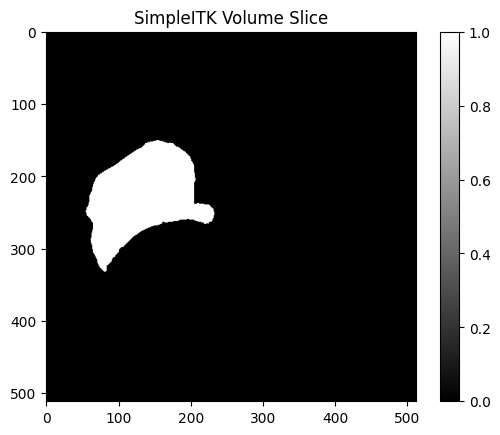

In [5]:
reader = sitk.ImageFileReader()
reader.SetImageIO("NiftiImageIO")
reader.SetFileName(r'/content/data/segmentations/segmentation-8.nii')
segment = reader.Execute();
segment = sitk.BinaryThreshold(segment, lowerThreshold=1, upperThreshold=255, insideValue=1, outsideValue=0)
#segment =sitk.OtsuThreshold(segment)

# Convert SimpleITK image to a NumPy array
image_array = sitk.GetArrayFromImage(segment)


# Choose a slice to visualize (e.g., the middle slice)
slice_number = round(len(image_array[:,0,0])/2)+150
# Get the 2D slice from the 3D volume
slice_to_display = image_array[ slice_number, :,:]

# Display the 2D slice using Matplotlib
plt.imshow(slice_to_display, cmap="gray")
plt.title("SimpleITK Volume Slice")
plt.colorbar()
plt.show()

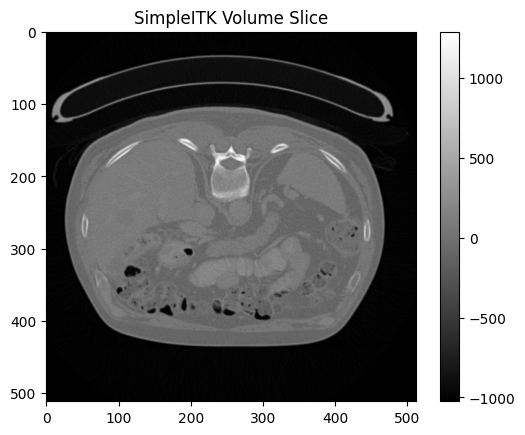

In [6]:
reader = sitk.ImageFileReader()
reader.SetImageIO("NiftiImageIO")
reader.SetFileName(r'/content/data/volume_pt1/volume-8.nii')
image = reader.Execute();

# Convert SimpleITK image to a NumPy array
image_array = sitk.GetArrayFromImage(image)

# Choose a slice to visualize (e.g., the middle slice)


# Get the 2D slice from the 3D volume
slice_to_display = image_array[ slice_number, :,:]

# Display the 2D slice using Matplotlib
plt.imshow(slice_to_display, cmap="gray")
plt.title("SimpleITK Volume Slice")
plt.colorbar()
plt.show()

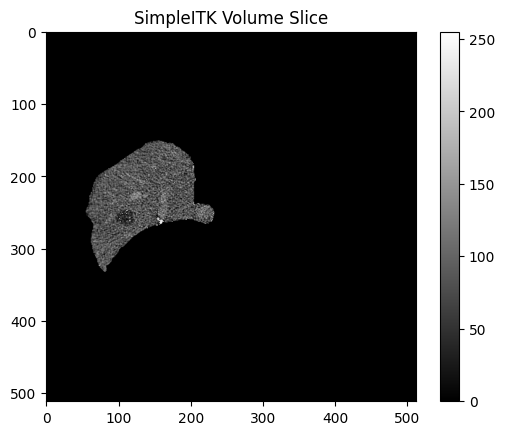

In [7]:
image=sitk.Cast(image, sitk.sitkUInt8)
segment=sitk.Cast(segment, sitk.sitkUInt8)
masked_volume = sitk.Mask(image, segment)
image_array = sitk.GetArrayFromImage(masked_volume)
segment_array = sitk.GetArrayFromImage(segment)

# Get the 2D slice from the 3D volume
slice_to_display = image_array[ slice_number, :,:]
segment_slice=segment_array[ slice_number, :,:]

segment_slice=cv2.inRange(segment_slice,1,255)
# Display the 2D slice using Matplotlib
plt.imshow(slice_to_display, cmap="gray")
plt.title("SimpleITK Volume Slice")
plt.colorbar()
plt.show()

40th Percentile Value: 78


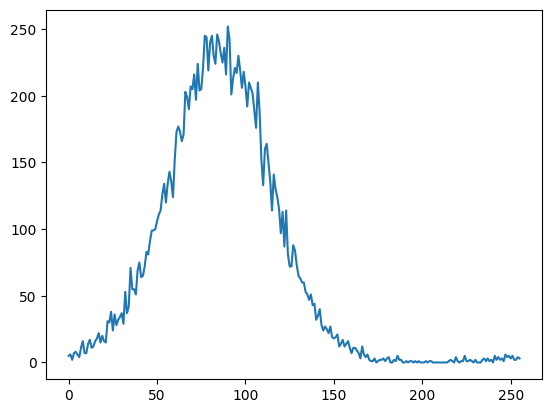

In [8]:
hist_mask = cv2.calcHist([slice_to_display],[0],segment_slice,[256],[0,256])
cdf = hist_mask.cumsum()
cdf = cdf / cdf[-1]  # Normalize CDF to [0, 1]

# Find the bin corresponding to the 40th percentile
percentile_value = 0.4  # 40th percentile
bin_index = int(np.searchsorted(cdf, percentile_value))

# The 'bin_index' variable now contains the bin corresponding to the 40th percentile.
# You can use this bin index to find the value at that bin in the original histogram.

# The 40th percentile value:

print(f'40th Percentile Value: {bin_index}')
plt.plot(hist_mask)
#plt.plot(cdf)
plt.show()

In [9]:
sift = cv2.xfeatures2d.SIFT_create()
orb_detector = cv2.ORB_create()


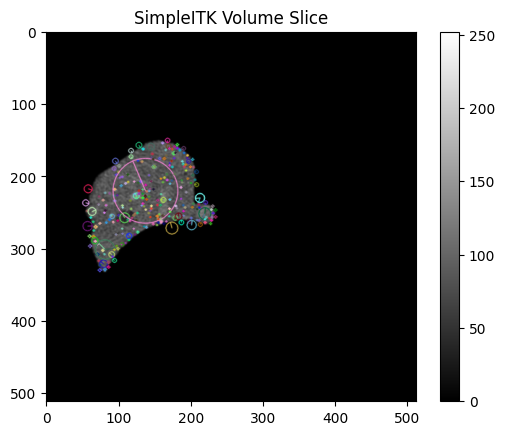

In [10]:
slice_to_display= cv2.GaussianBlur(slice_to_display, (5, 5), 0)
original_keypoints, original_descriptor = sift.detectAndCompute(slice_to_display, None)
sift_keypoints, _ = orb_detector.detectAndCompute(slice_to_display, None)
img_sift = cv2.drawKeypoints(slice_to_display, original_keypoints, outImage=None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
#cv2.drawKeypoints(original_face, original_keypoints, keypoints_without_size, color = (0, 255, 0))


plt.imshow(img_sift, cmap="gray")
plt.title("SimpleITK Volume Slice")
plt.colorbar()
plt.show()



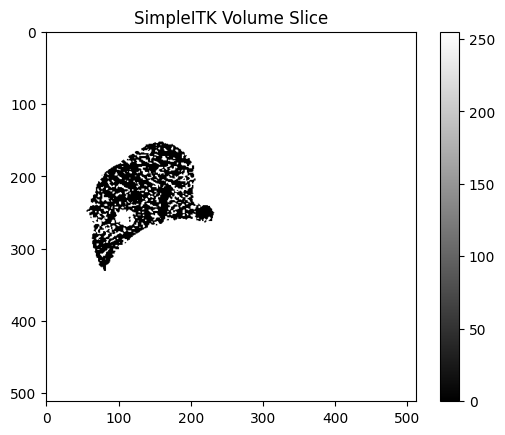

In [11]:




b_mask=cv2.inRange(slice_to_display,0,bin_index)


plt.imshow(b_mask, cmap="gray")
plt.title("SimpleITK Volume Slice")
plt.colorbar()
plt.show()

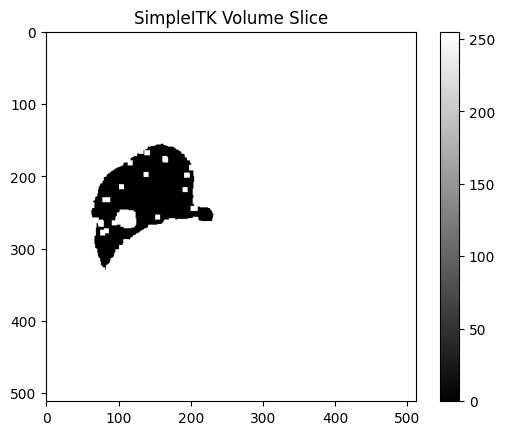

In [12]:
kernel = np.ones((4, 4), np.uint8)
img_erosion = cv2.erode(b_mask, kernel, iterations=1)
img_dilation = cv2.dilate(img_erosion, kernel, iterations=2)


plt.imshow(img_dilation, cmap="gray")
plt.title("SimpleITK Volume Slice")
plt.colorbar()
plt.show()

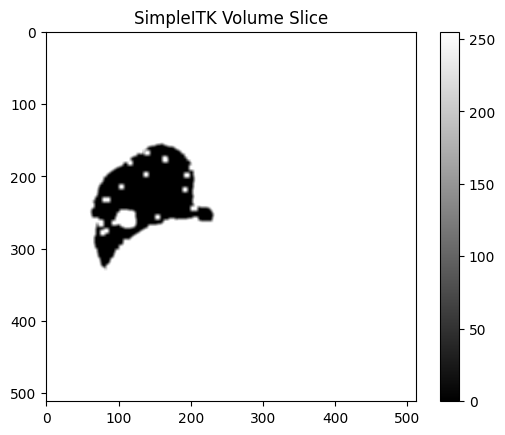

In [13]:
kernel = np.ones((5,5),np.float32)/25
img_smoothed = cv2.filter2D(img_dilation,-1,kernel)
plt.imshow(img_smoothed, cmap="gray")
plt.title("SimpleITK Volume Slice")
plt.colorbar()
plt.show()

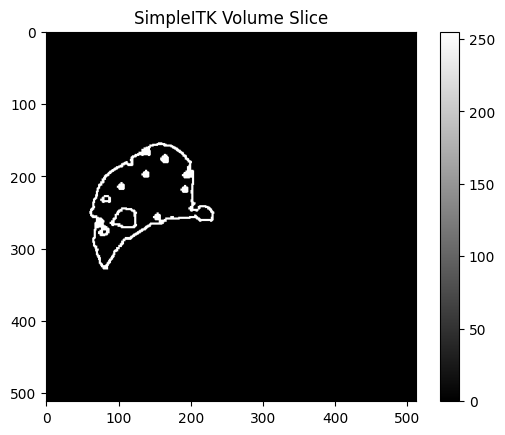

In [14]:
kernel = np.ones((3,3),np.float32)/25
edged = cv2.Canny(img_smoothed, 30, 200)
edged2 = cv2.dilate(edged, kernel, iterations=2)
img_erosion2 = cv2.erode(edged2, kernel, iterations=1)
plt.imshow(img_erosion2, cmap="gray")
plt.title("SimpleITK Volume Slice")
plt.colorbar()
plt.show()

Number of Contours found = 11
Area inside rect1: 30448
Contour area: 15335.0
Area inside rect1: 36
Contour area: 21.5
Area inside rect1: 28056
Contour area: 13092.0
Area inside rect1: 1102
Contour area: 776.0
Area inside rect1: 725
Contour area: 506.5
Area inside rect1: 165
Contour area: 107.0
Area inside rect1: 42
Contour area: 28.0
Area inside rect1: 121
Contour area: 72.0
Area inside rect1: 121
Contour area: 72.0
Area inside rect1: 121
Contour area: 72.0
Area inside rect1: 156
Contour area: 100.5
Number of Contours draw = 9


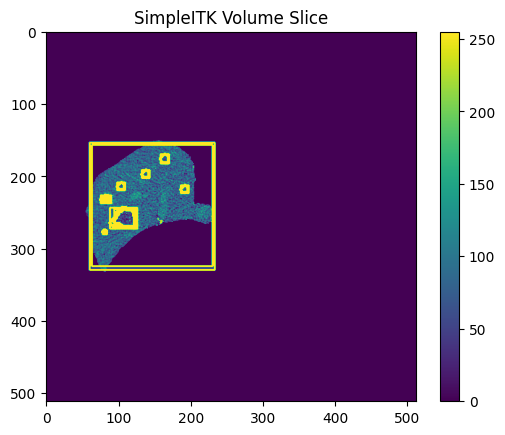

In [18]:
contours, hierarchy = cv2.findContours(img_erosion2,cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
print("Number of Contours found = " + str(len(contours)))

cnt=[]
rect=[]
image_array = sitk.GetArrayFromImage(masked_volume)
sliced = image_array[ slice_number, :,:]

# Iterate through the sorted contours
for contour in contours:
    # Get the area of the current contour
    area = cv2.contourArea(contour)
    rect1 = cv2.boundingRect(contour)

    cv2.rectangle(sliced, (rect1[0], rect1[1]), (rect1[0] + rect1[2], rect1[1] + rect1[3]), [255,255,255], 2)


    area_inside_rect1 = rect1[2] * rect1[3]
    if area>10 and area_inside_rect1<20000:
      cnt.append(contour)

    # Print the result
    print("Area inside rect1:", area_inside_rect1)

    # Do something with the contour or area (e.g., print the area)
    print(f"Contour area: {area}")

print("Number of Contours draw = " + str(len(cnt)))







cv2.drawContours(sliced, cnt, -1, (255, 255, 255),3)

plt.imshow(sliced)
plt.title("SimpleITK Volume Slice")
plt.colorbar()
plt.show()

cont len 1 oo 1
cont len 1 oo 1
cont len 1 oo 1
cont len 1 oo 1
cont len 1 oo 1
cont len 1 oo 1
cont len 1 oo 1
cont len 1 oo 1
cont len 1 oo 1
cont len 1 oo 1
cont len 1 oo 1
11 11


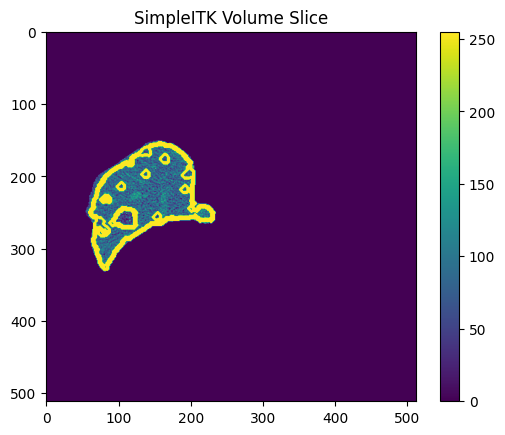

In [28]:
non_overlapping_contours = []

for contour in contours:
    # Initialize a variable to track overlap status
    is_overlapping = False
    overlap=0
    # Check if the reference contour fully contains the current contour
    for point in contour[0]:
        result = cv2.pointPolygonTest(contours_seg[0], (int(point[0]),int(point[1])), measureDist=False)
        if result >= 0:
            overlap=overlap+1
    print("cont len",len(contour[0]),'oo',overlap)

    # If the contour doesn't overlap with any reference contour, add it to the list
    if not is_overlapping:
        non_overlapping_contours.append(contour)

image_array = sitk.GetArrayFromImage(masked_volume)
sliced = image_array[ slice_number, :,:]
print(len(contours),len(non_overlapping_contours))
cv2.drawContours(sliced, non_overlapping_contours, -1, (255, 255, 255),3)

plt.imshow(sliced)
plt.title("SimpleITK Volume Slice")
plt.colorbar()
plt.show()

In [26]:
len(contours_seg)

1

16716.0
Area inside rect1: 32396


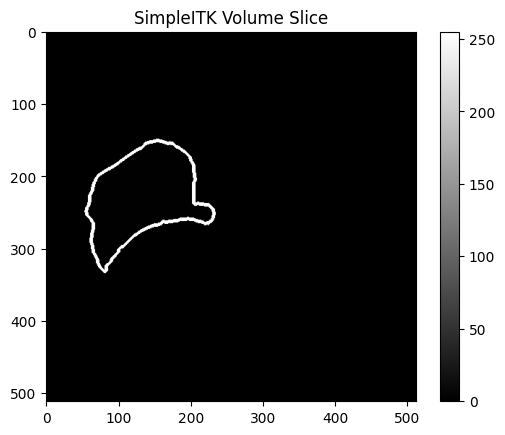

In [23]:

image_array = sitk.GetArrayFromImage(segment)
segment_slice=image_array[ slice_number, :,:]
edged_seg = segment_slice
contours_seg, hierarchy = cv2.findContours(edged_seg,cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

area = cv2.contourArea(contours_seg[0])
print(area)
rect1 = cv2.boundingRect(contours_seg[0])
area_inside_rect1 = rect1[2] * rect1[3]

# Print the result
print("Area inside rect1:", area_inside_rect1)

cv2.drawContours(edged_seg, contours_seg, -1, (255, 255, 255),3)
plt.imshow(segment_slice, cmap="gray")
plt.title("SimpleITK Volume Slice")
plt.colorbar()
plt.show()

In [24]:
print(image_array.shape)
print(segment_array.shape)


(541, 512, 512)
(541, 512, 512)


In [25]:
contours_seg

(array([[[152, 151]],
 
        [[151, 152]],
 
        [[150, 152]],
 
        ...,
 
        [[155, 151]],
 
        [[154, 151]],
 
        [[153, 151]]], dtype=int32),)

0
Number of Contours found = 0
1
Number of Contours found = 0


<ipython-input-29-9da60e2c657c>:43: RuntimeWarning: invalid value encountered in divide
  cdf = cdf / cdf[-1]  # Normalize CDF to [0, 1]


2
Number of Contours found = 0
3
Number of Contours found = 0
4
Number of Contours found = 0
5
Number of Contours found = 0
6
Number of Contours found = 0
7
Number of Contours found = 0
8
Number of Contours found = 0
9
Number of Contours found = 0
10
Number of Contours found = 0
11
Number of Contours found = 0
12
Number of Contours found = 0
13
Number of Contours found = 0
14
Number of Contours found = 0
15
Number of Contours found = 0
16
Number of Contours found = 0
17
Number of Contours found = 0
18
Number of Contours found = 0
19
Number of Contours found = 0
20
Number of Contours found = 0
21
Number of Contours found = 0
22
Number of Contours found = 0
23
Number of Contours found = 0
24
Number of Contours found = 0
25
Number of Contours found = 0
26
Number of Contours found = 0
27
Number of Contours found = 0
28
Number of Contours found = 0
29
Number of Contours found = 0
30
Number of Contours found = 0
31
Number of Contours found = 0
32
Number of Contours found = 0
33
Number of Con

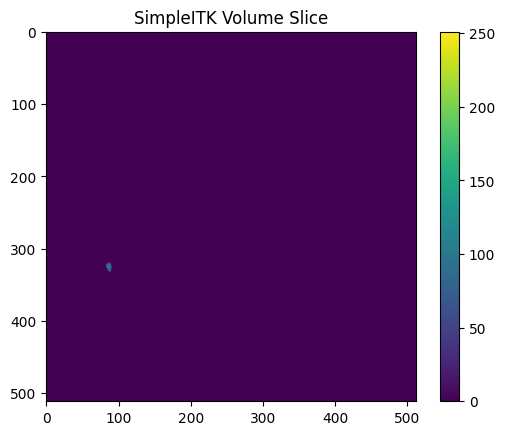

335
Number of Contours found = 1
Number of Contours draw = 1


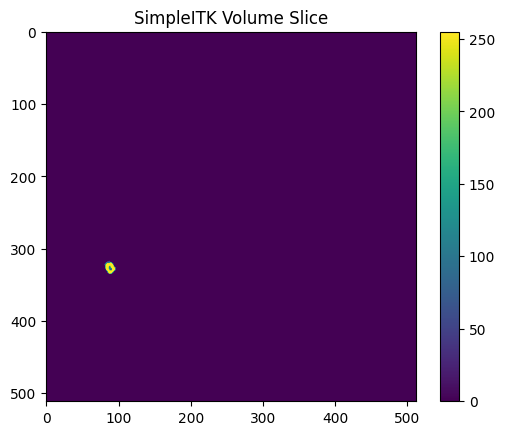

336
Number of Contours found = 1
Number of Contours draw = 1


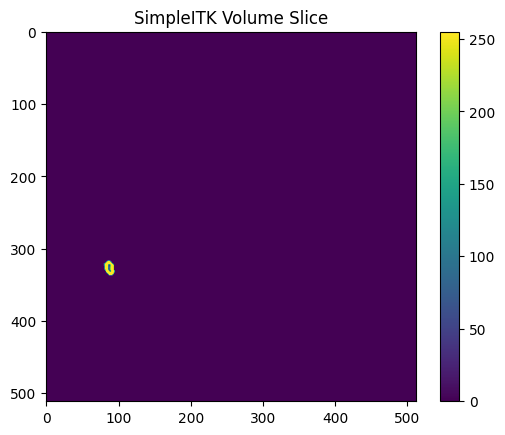

337
Number of Contours found = 2
Number of Contours draw = 2


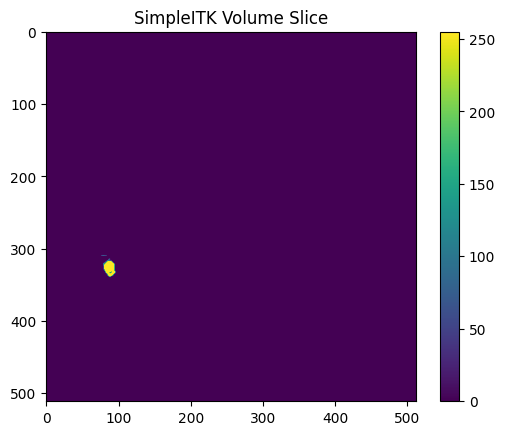

338
Number of Contours found = 2
Number of Contours draw = 1


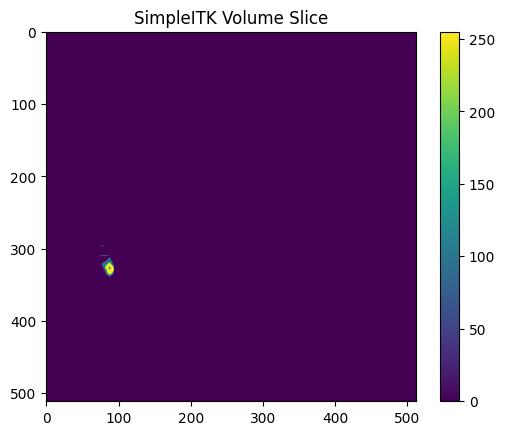

339
Number of Contours found = 2
Number of Contours draw = 1


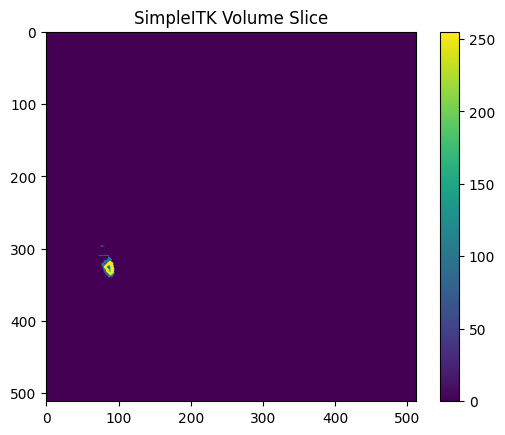

340
Number of Contours found = 2
Number of Contours draw = 1


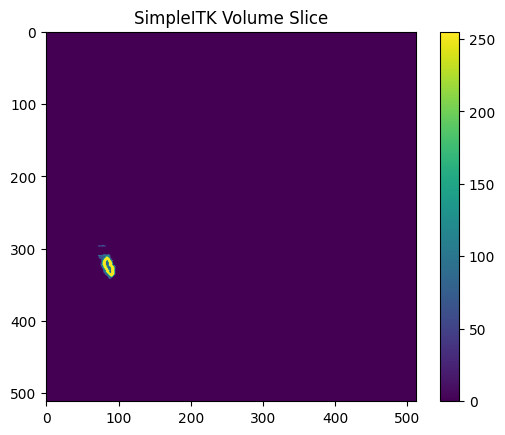

341
Number of Contours found = 3
Number of Contours draw = 2


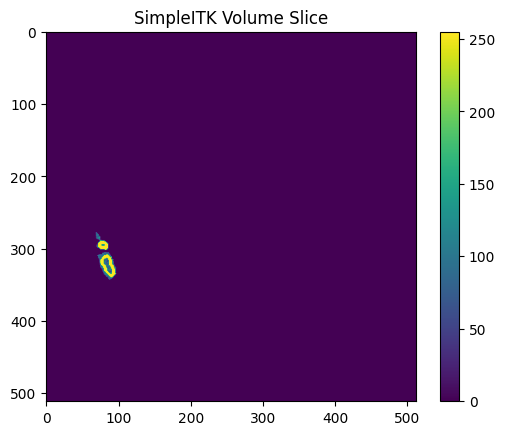

342
Number of Contours found = 2
Number of Contours draw = 1


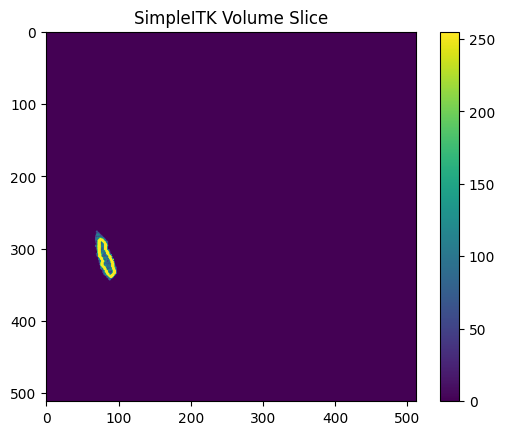

343
Number of Contours found = 2
Number of Contours draw = 1


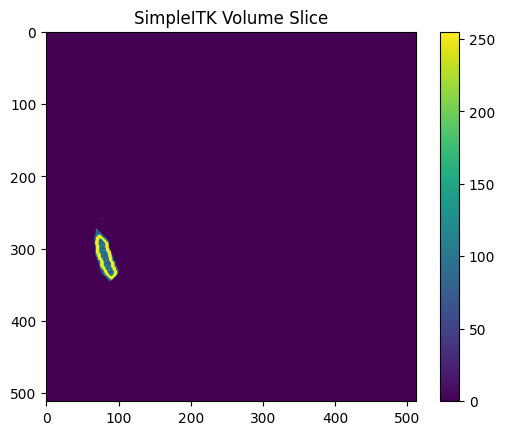

344
Number of Contours found = 2
Number of Contours draw = 0


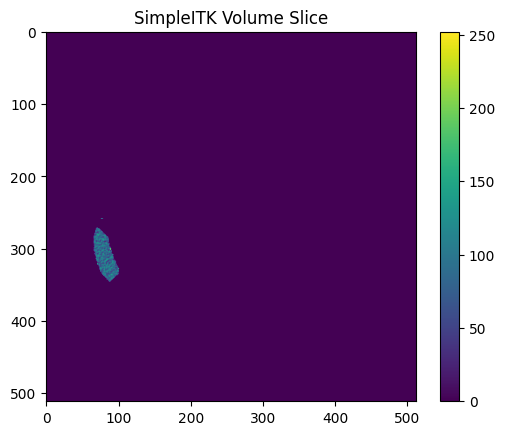

345
Number of Contours found = 2
Number of Contours draw = 1


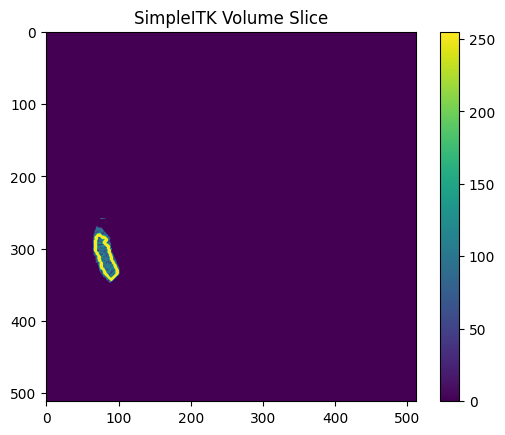

346
Number of Contours found = 2
Number of Contours draw = 0


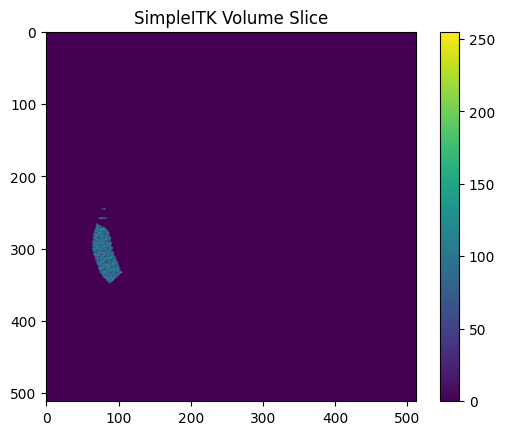

347
Number of Contours found = 2
Number of Contours draw = 1


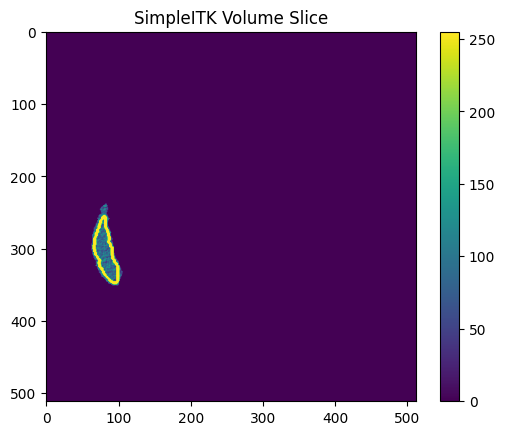

348
Number of Contours found = 2
Number of Contours draw = 0


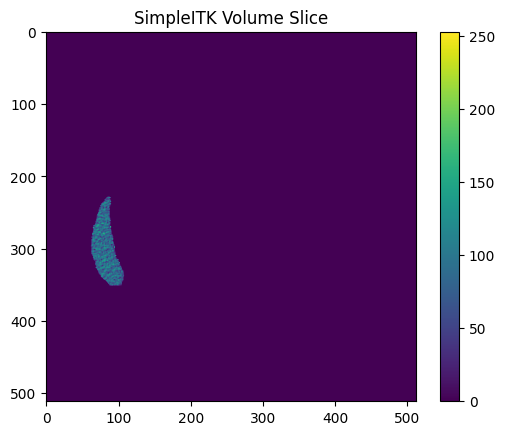

349
Number of Contours found = 2
Number of Contours draw = 0


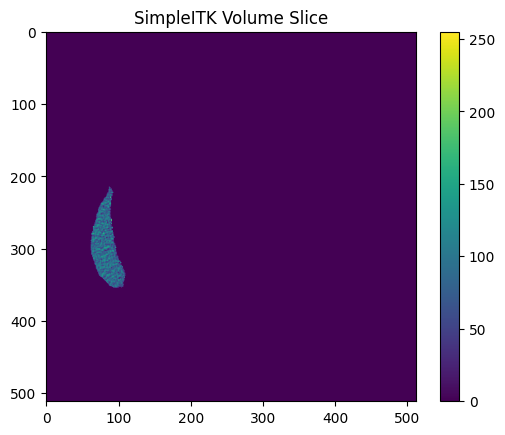

350
Number of Contours found = 2
Number of Contours draw = 0


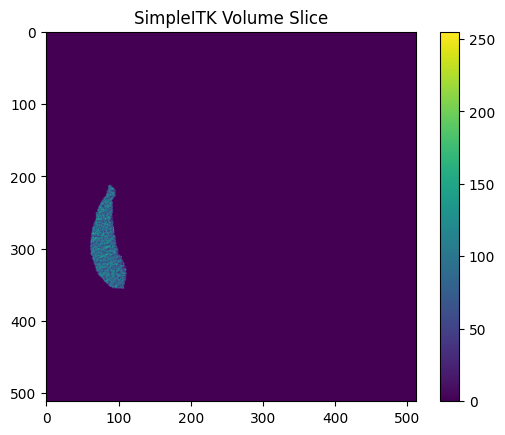

351
Number of Contours found = 2
Number of Contours draw = 0


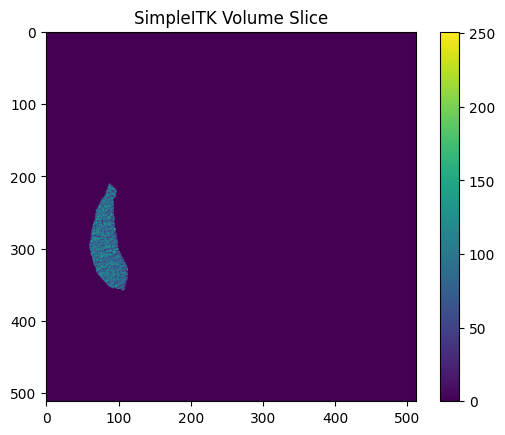

352
Number of Contours found = 2
Number of Contours draw = 0


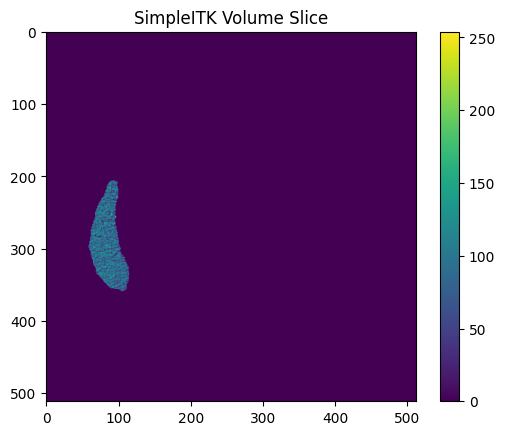

353
Number of Contours found = 2
Number of Contours draw = 0


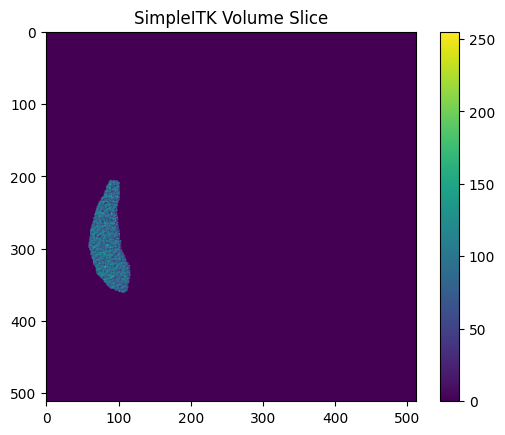

354
Number of Contours found = 2
Number of Contours draw = 0


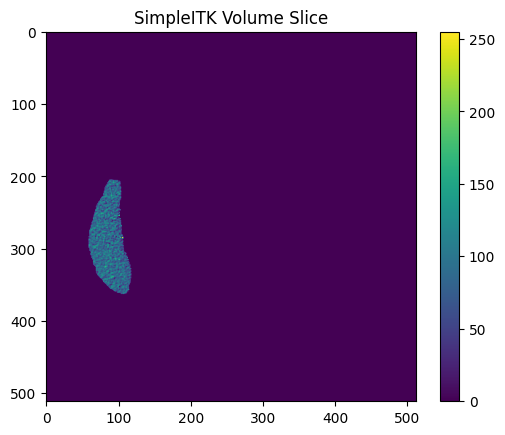

355
Number of Contours found = 2
Number of Contours draw = 0


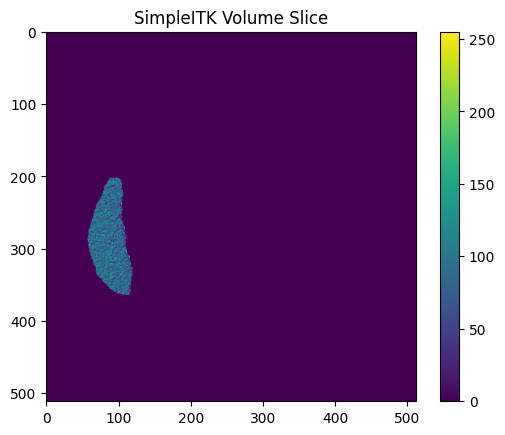

356
Number of Contours found = 2
Number of Contours draw = 0


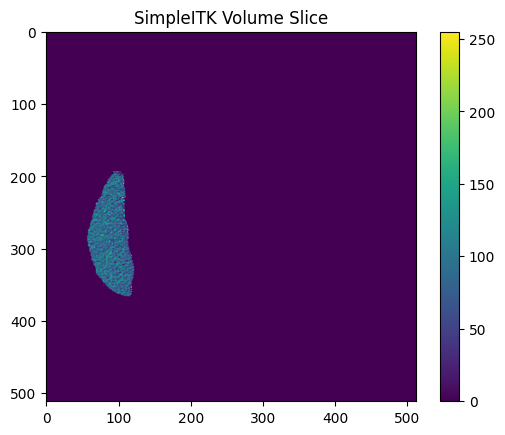

357
Number of Contours found = 2
Number of Contours draw = 0


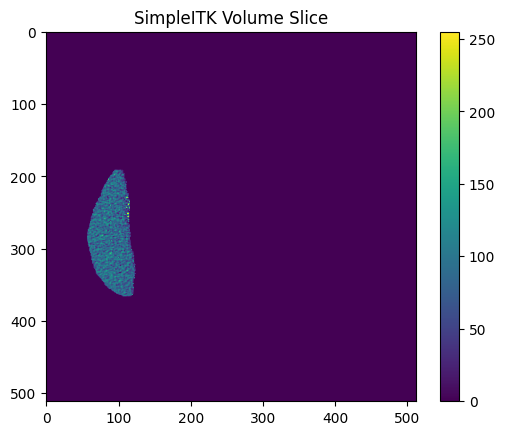

358
Number of Contours found = 2
Number of Contours draw = 0


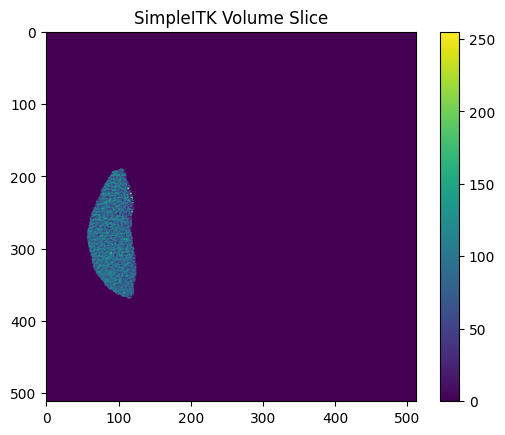

359
Number of Contours found = 2
Number of Contours draw = 0


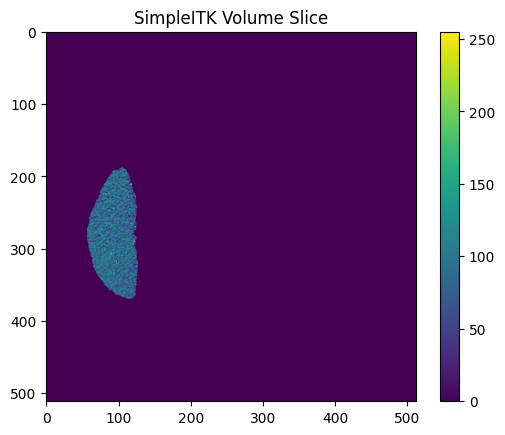

360
Number of Contours found = 2
Number of Contours draw = 0


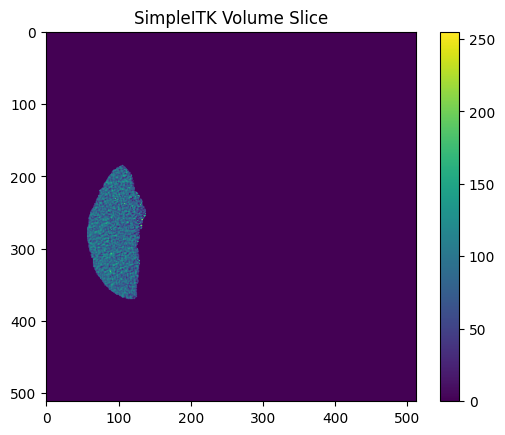

361
Number of Contours found = 2
Number of Contours draw = 0


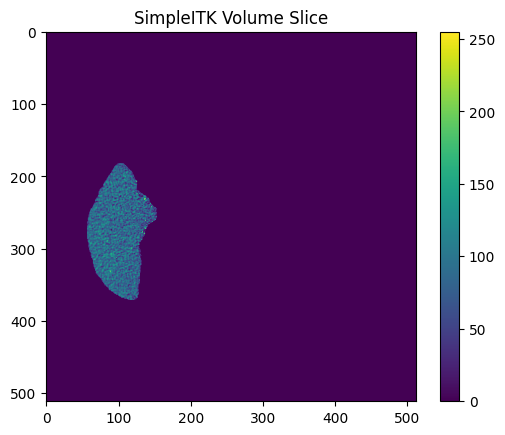

362
Number of Contours found = 2
Number of Contours draw = 0


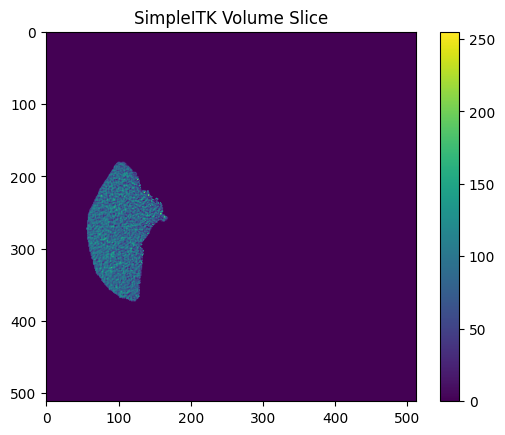

363
Number of Contours found = 2
Number of Contours draw = 0


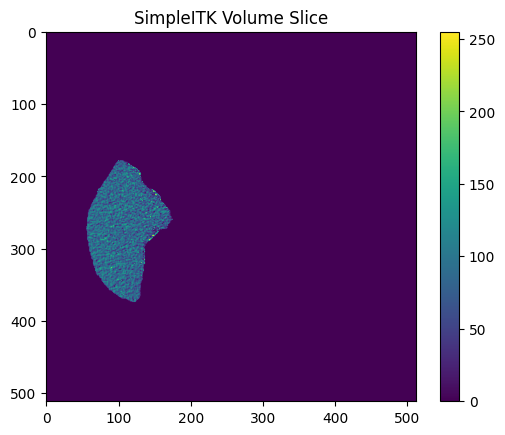

364
Number of Contours found = 3
Number of Contours draw = 1


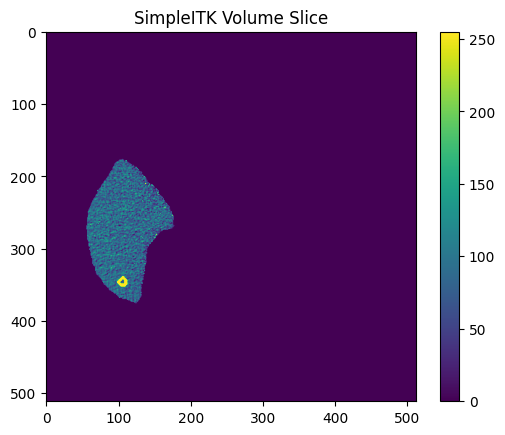

365
Number of Contours found = 2
Number of Contours draw = 0


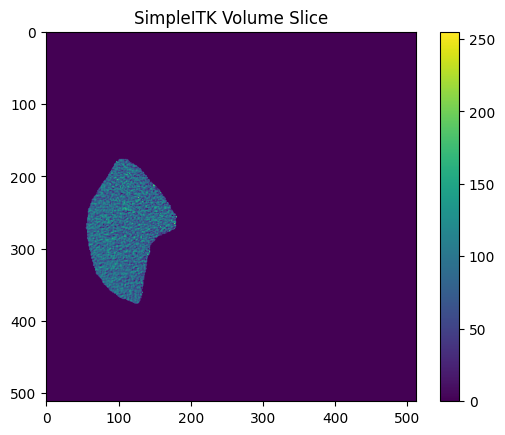

366
Number of Contours found = 2
Number of Contours draw = 0


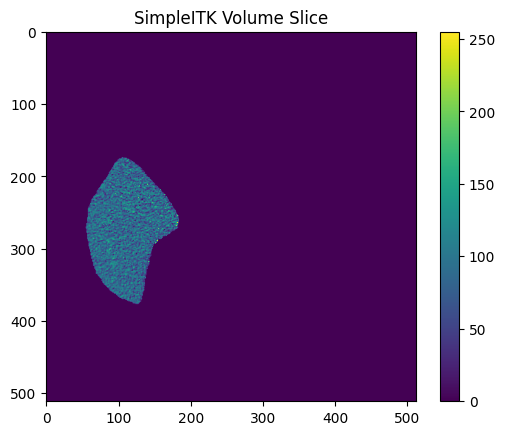

367
Number of Contours found = 3
Number of Contours draw = 1


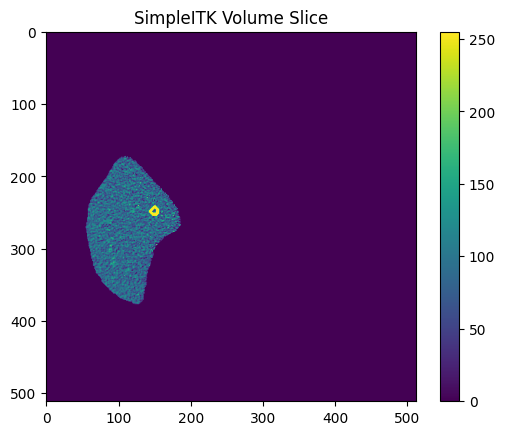

368
Number of Contours found = 2
Number of Contours draw = 0


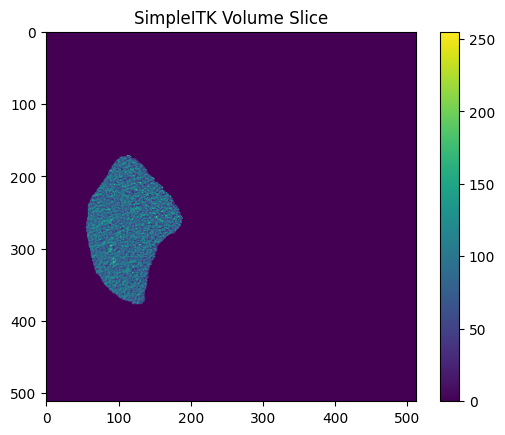

369
Number of Contours found = 2
Number of Contours draw = 0


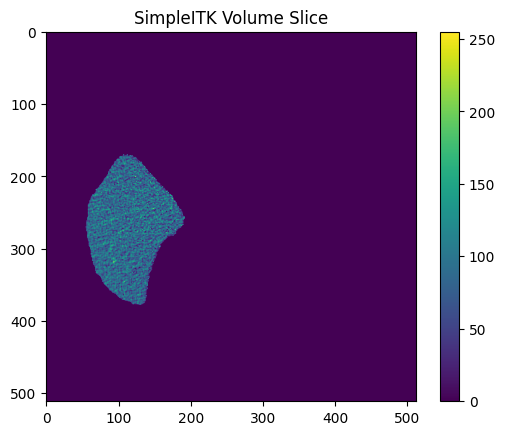

370
Number of Contours found = 3
Number of Contours draw = 1


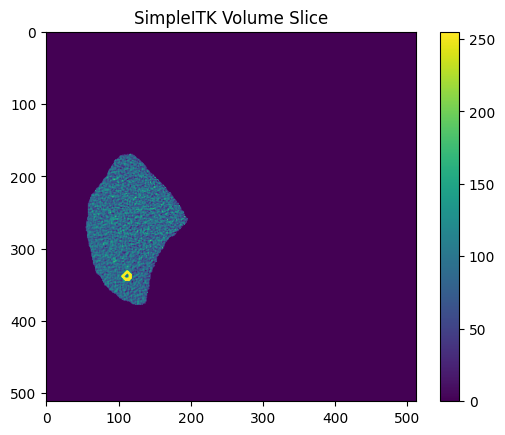

371
Number of Contours found = 2
Number of Contours draw = 0


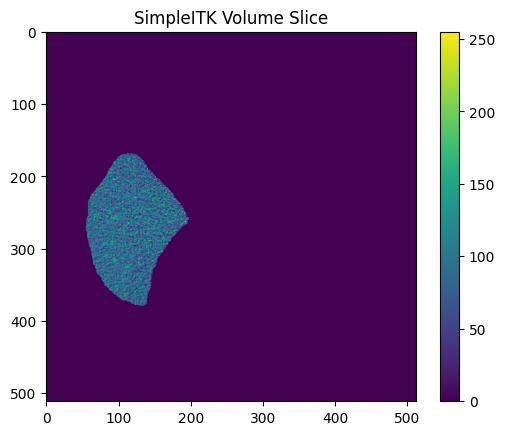

372
Number of Contours found = 2
Number of Contours draw = 0


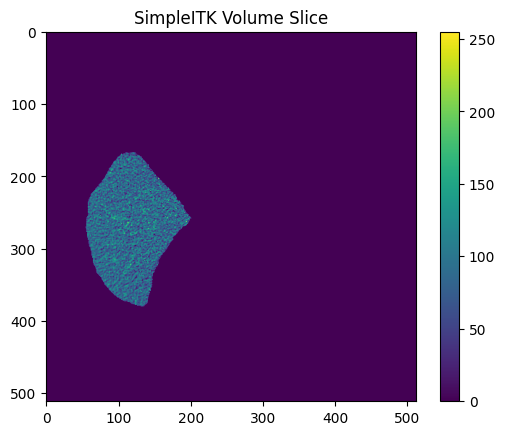

373
Number of Contours found = 4
Number of Contours draw = 2


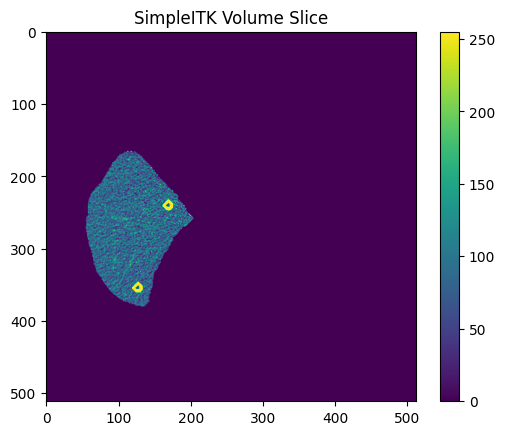

374
Number of Contours found = 2
Number of Contours draw = 0


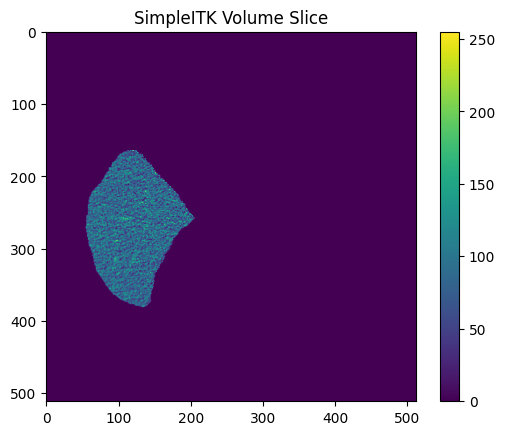

375
Number of Contours found = 9
Number of Contours draw = 0


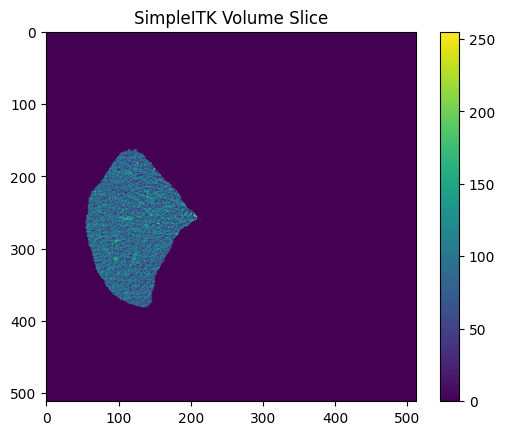

376
Number of Contours found = 2
Number of Contours draw = 0


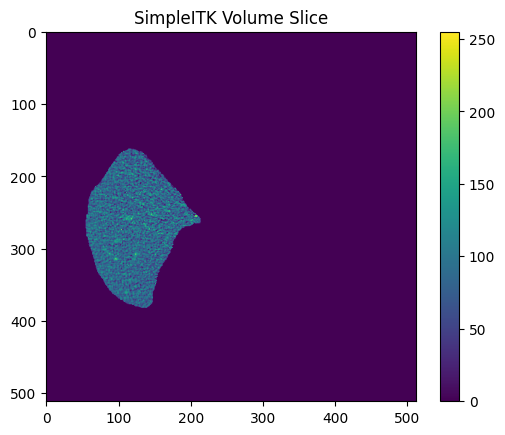

377
Number of Contours found = 6
Number of Contours draw = 0


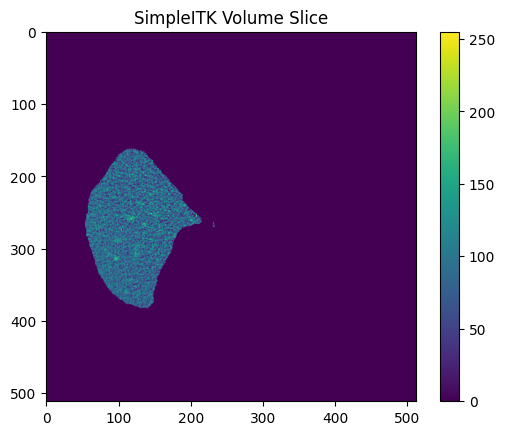

378
Number of Contours found = 4
Number of Contours draw = 1


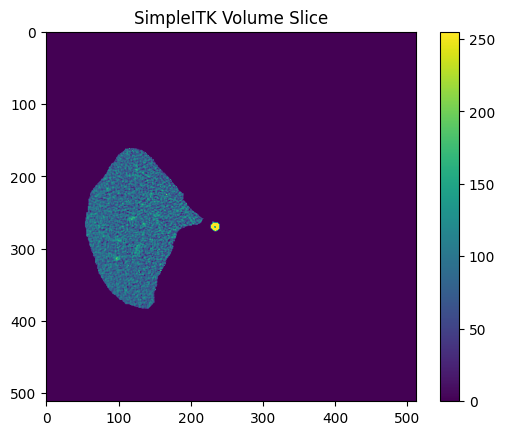

379
Number of Contours found = 5
Number of Contours draw = 3


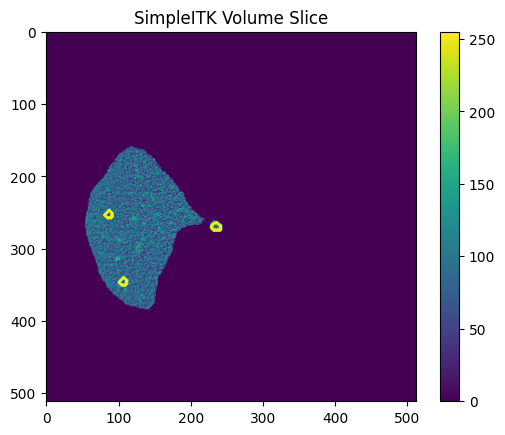

380
Number of Contours found = 5
Number of Contours draw = 0


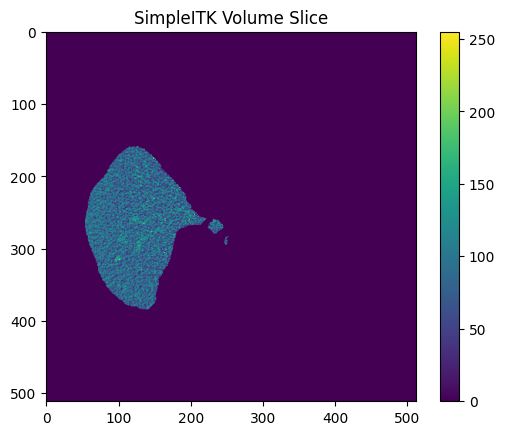

381
Number of Contours found = 8
Number of Contours draw = 4


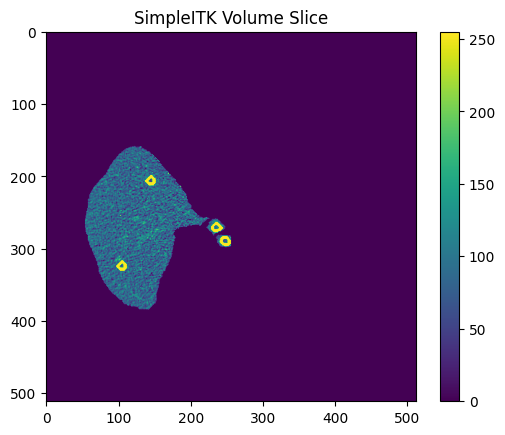

382
Number of Contours found = 4
Number of Contours draw = 2


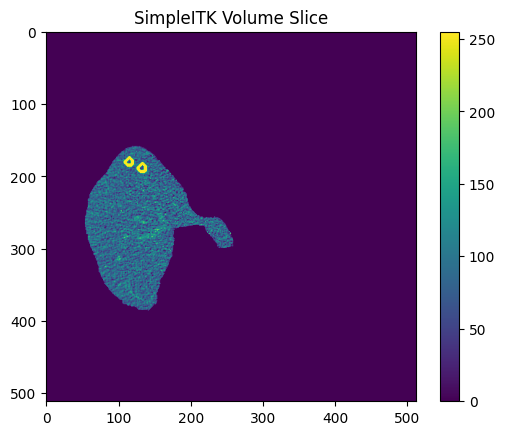

383
Number of Contours found = 6
Number of Contours draw = 4


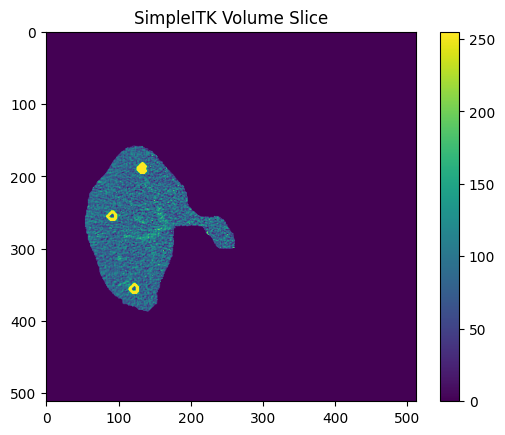

384
Number of Contours found = 2
Number of Contours draw = 0


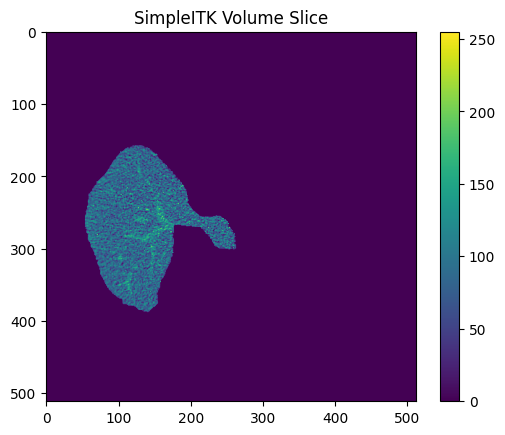

385
Number of Contours found = 6
Number of Contours draw = 0


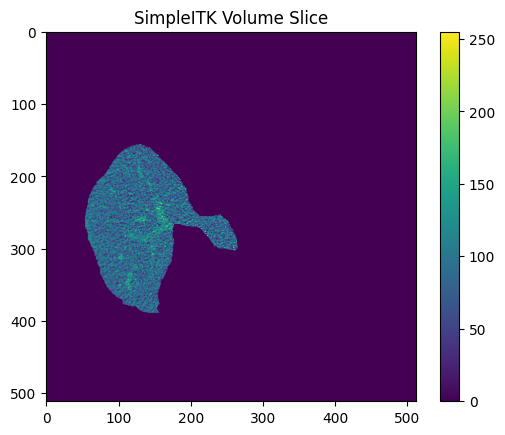

386
Number of Contours found = 5
Number of Contours draw = 3


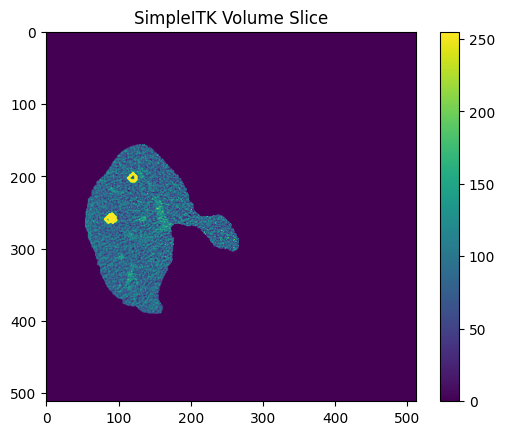

387
Number of Contours found = 2
Number of Contours draw = 0


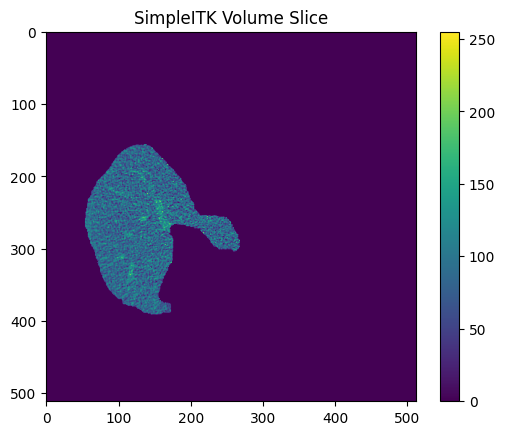

388
Number of Contours found = 2
Number of Contours draw = 0


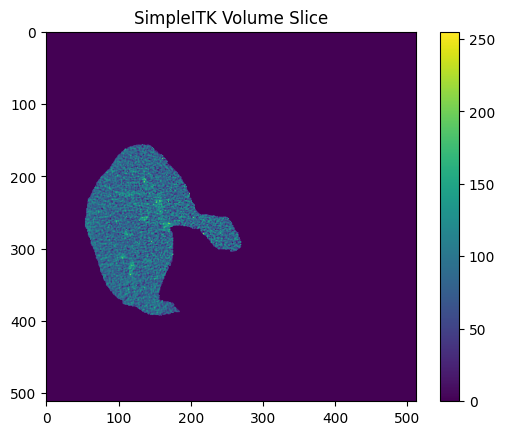

389
Number of Contours found = 4
Number of Contours draw = 2


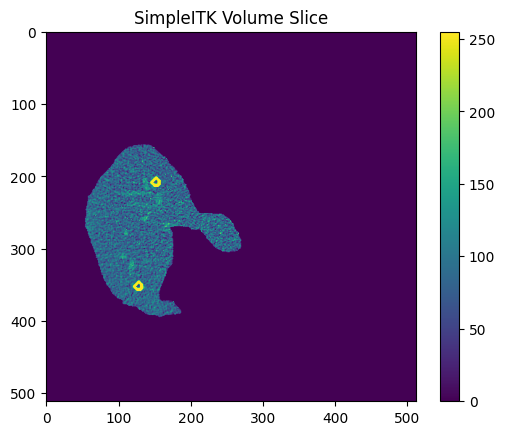

390
Number of Contours found = 3
Number of Contours draw = 1


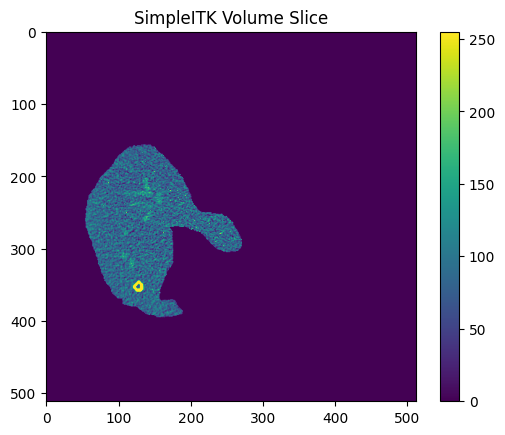

391
Number of Contours found = 4
Number of Contours draw = 0


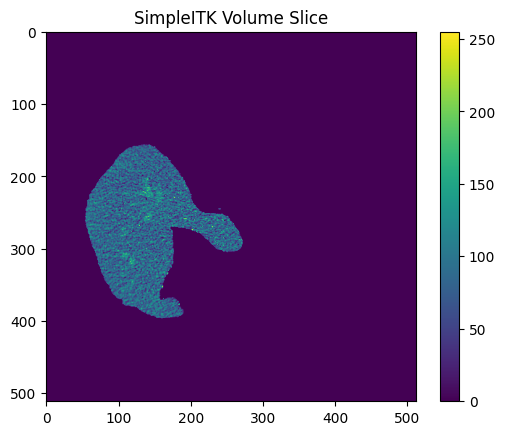

392
Number of Contours found = 3
Number of Contours draw = 0


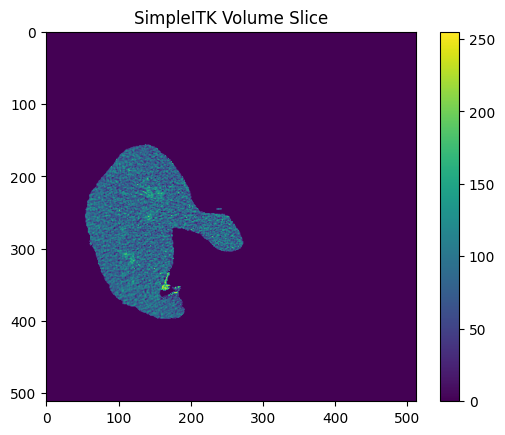

393
Number of Contours found = 9
Number of Contours draw = 0


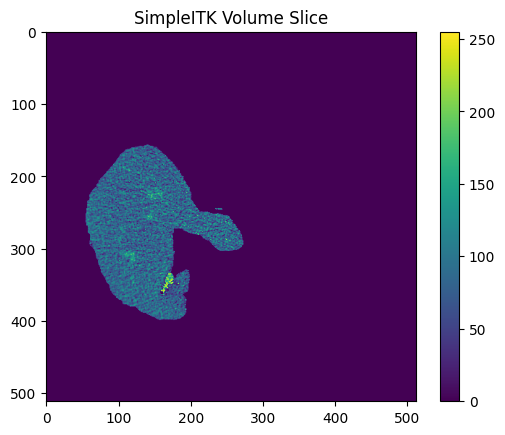

394
Number of Contours found = 8
Number of Contours draw = 0


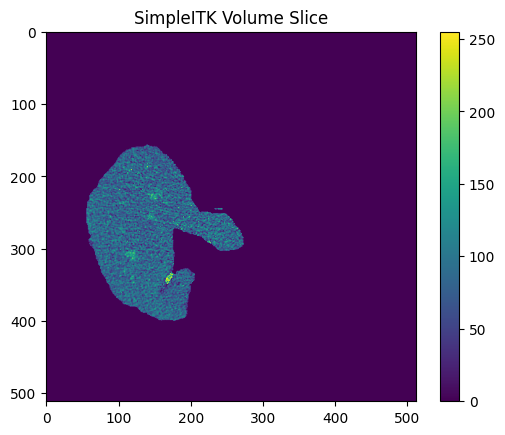

395
Number of Contours found = 4
Number of Contours draw = 0


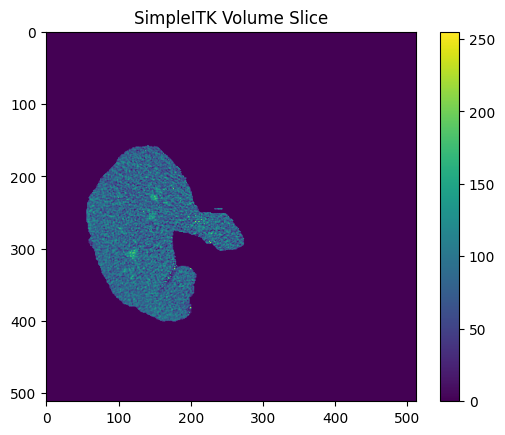

396
Number of Contours found = 4
Number of Contours draw = 0


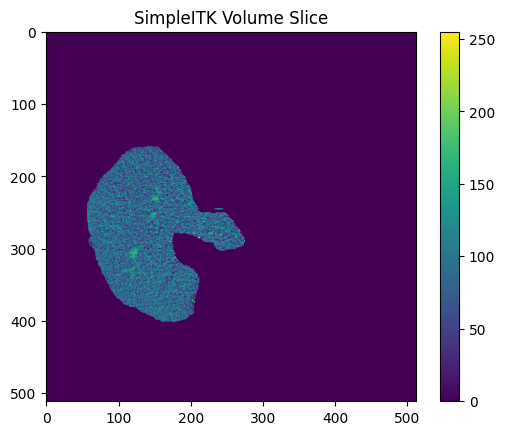

397
Number of Contours found = 2
Number of Contours draw = 0


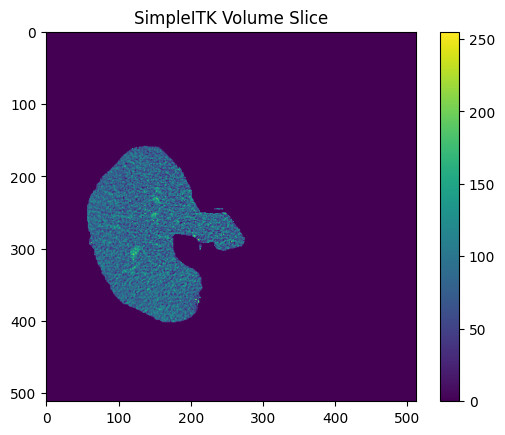

398
Number of Contours found = 5
Number of Contours draw = 0


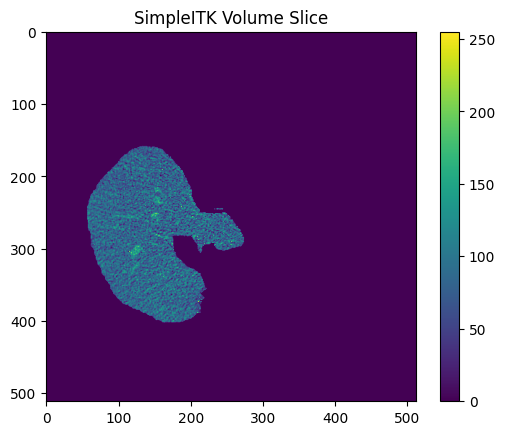

399
Number of Contours found = 4
Number of Contours draw = 0


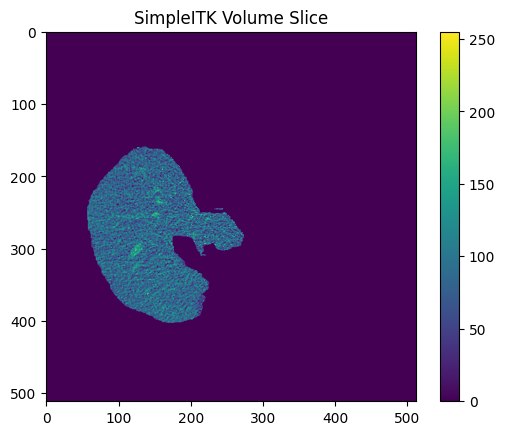

400
Number of Contours found = 6
Number of Contours draw = 0


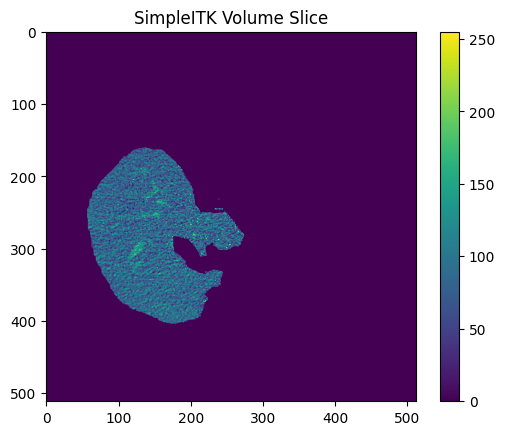

401
Number of Contours found = 4
Number of Contours draw = 0


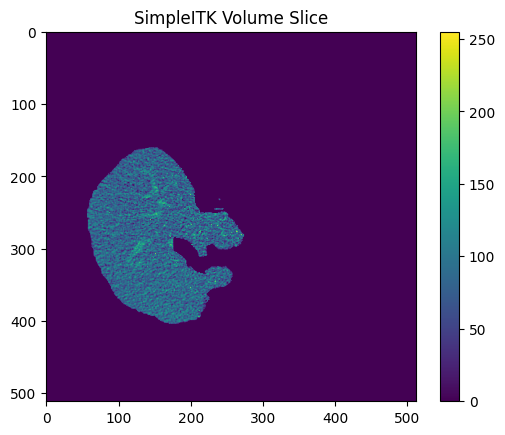

402
Number of Contours found = 10
Number of Contours draw = 0


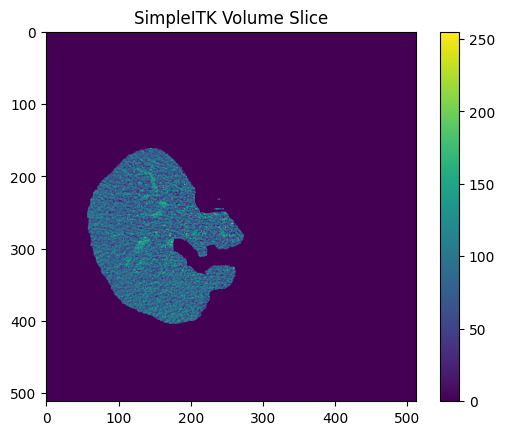

403
Number of Contours found = 7
Number of Contours draw = 0


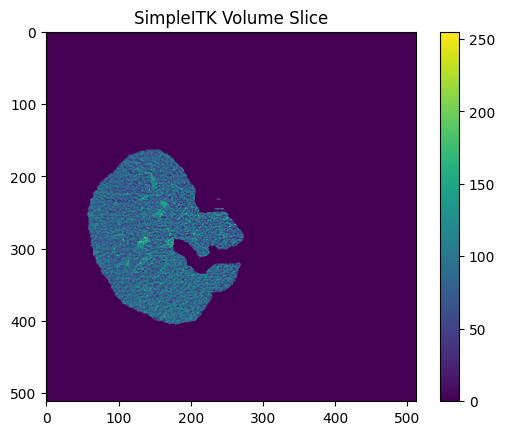

404
Number of Contours found = 4
Number of Contours draw = 0


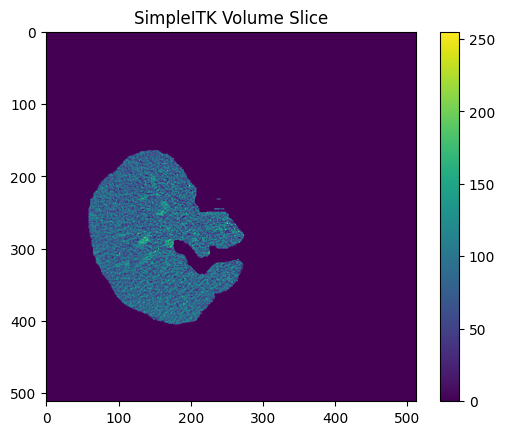

405
Number of Contours found = 7
Number of Contours draw = 0


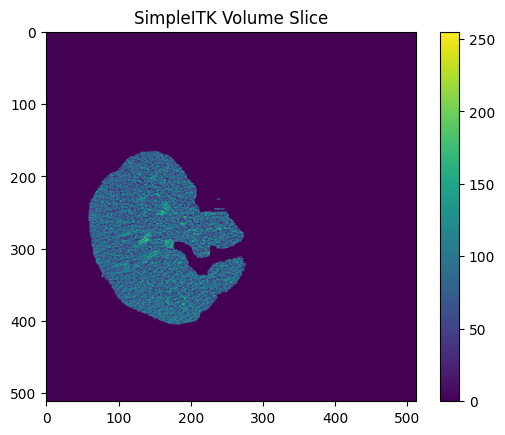

406
Number of Contours found = 5
Number of Contours draw = 0


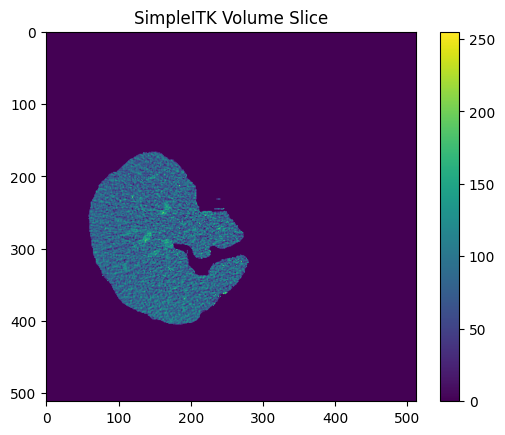

407
Number of Contours found = 8
Number of Contours draw = 0


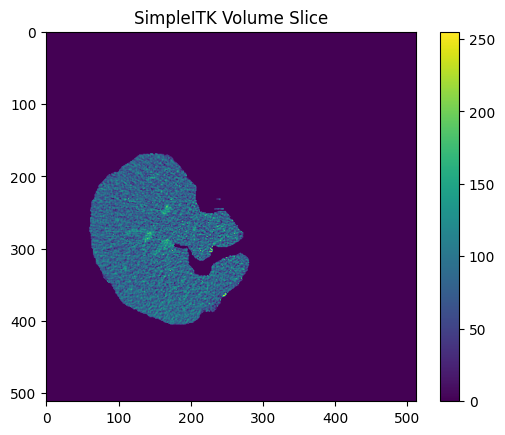

408
Number of Contours found = 8
Number of Contours draw = 0


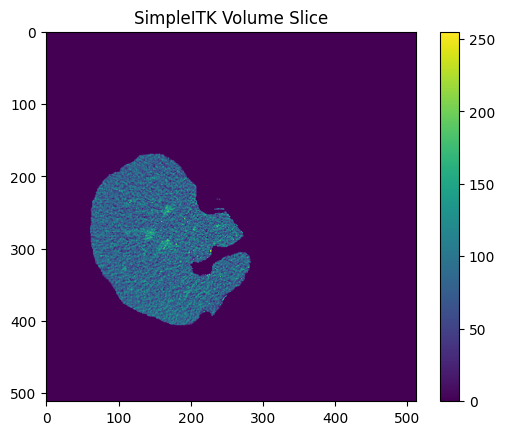

409
Number of Contours found = 5
Number of Contours draw = 0


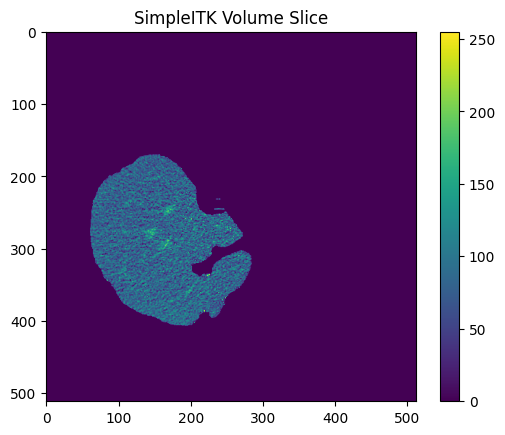

410
Number of Contours found = 8
Number of Contours draw = 1


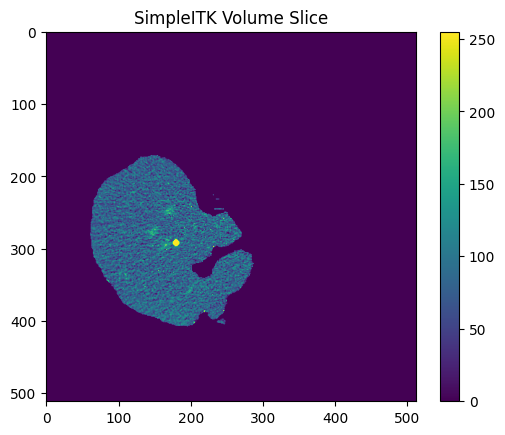

411
Number of Contours found = 3
Number of Contours draw = 0


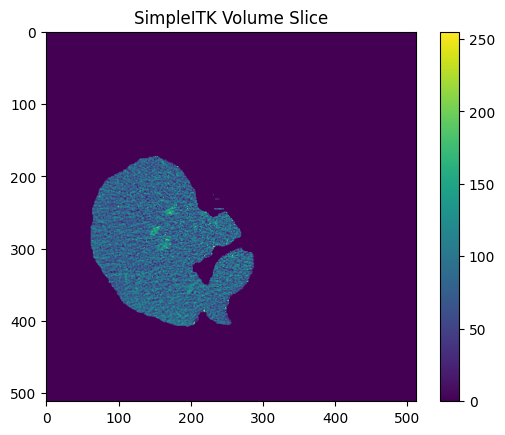

412
Number of Contours found = 6
Number of Contours draw = 0


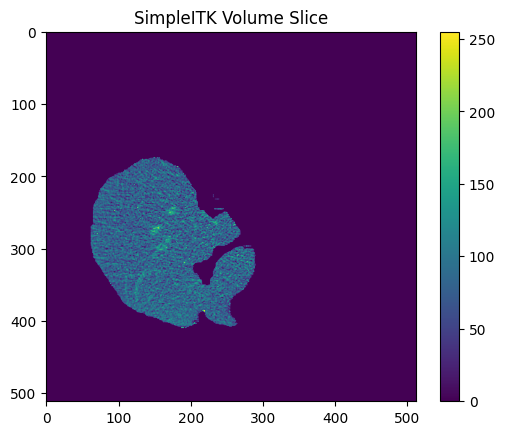

413
Number of Contours found = 4
Number of Contours draw = 0


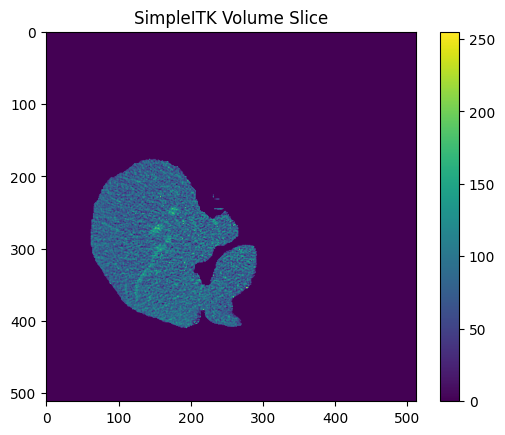

414
Number of Contours found = 6
Number of Contours draw = 0


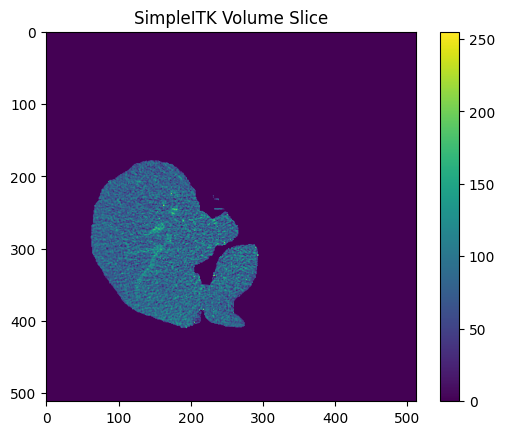

415
Number of Contours found = 5
Number of Contours draw = 0


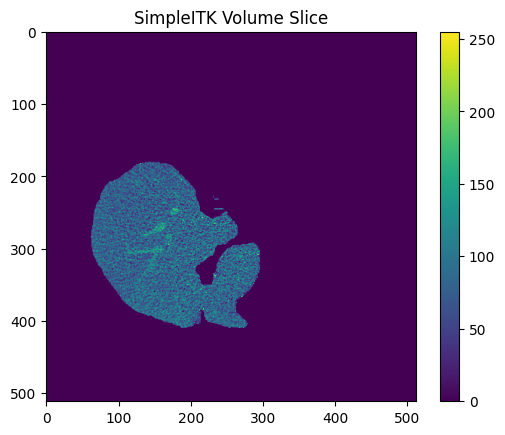

416
Number of Contours found = 7
Number of Contours draw = 0


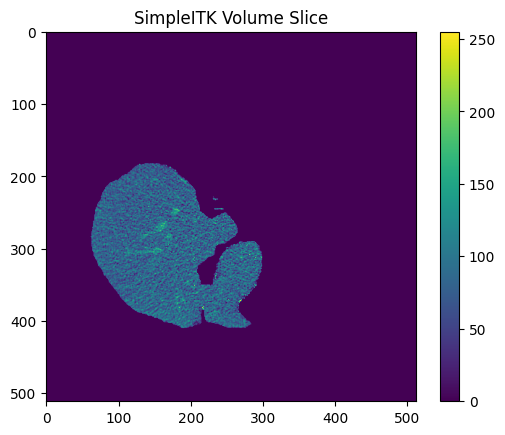

417
Number of Contours found = 3
Number of Contours draw = 0


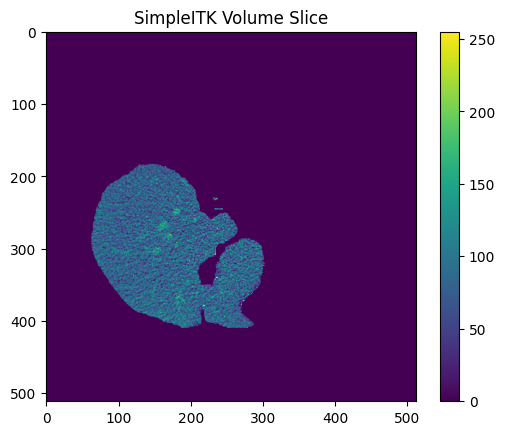

418
Number of Contours found = 7
Number of Contours draw = 0


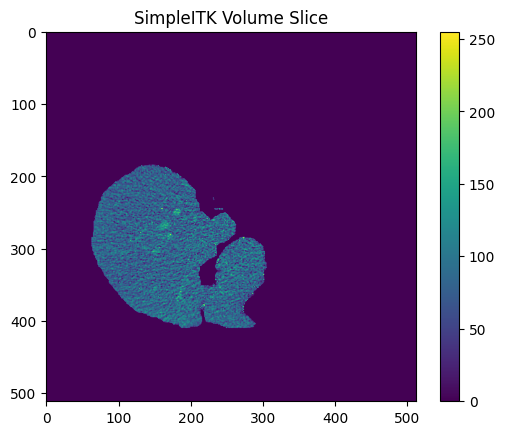

419
Number of Contours found = 4
Number of Contours draw = 0


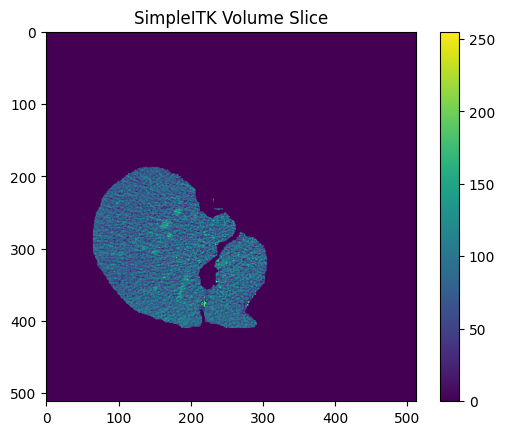

420
Number of Contours found = 8
Number of Contours draw = 0


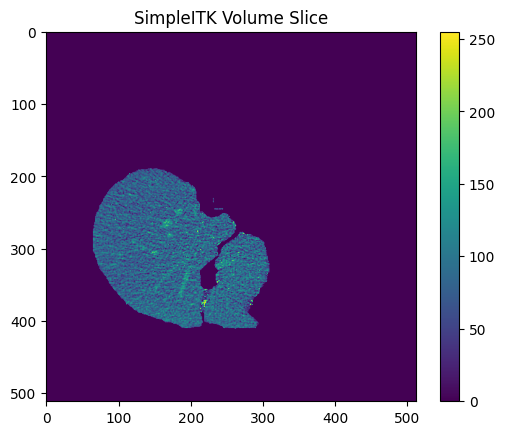

421
Number of Contours found = 9
Number of Contours draw = 0


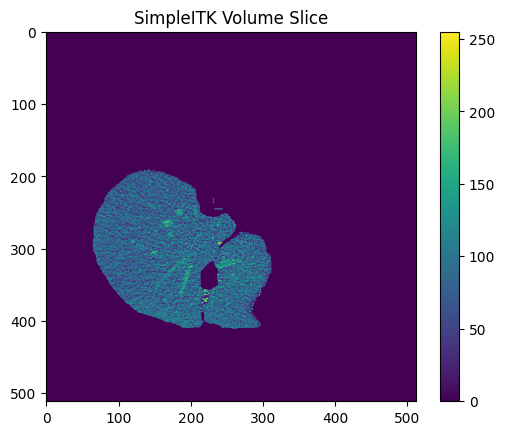

422
Number of Contours found = 9
Number of Contours draw = 0


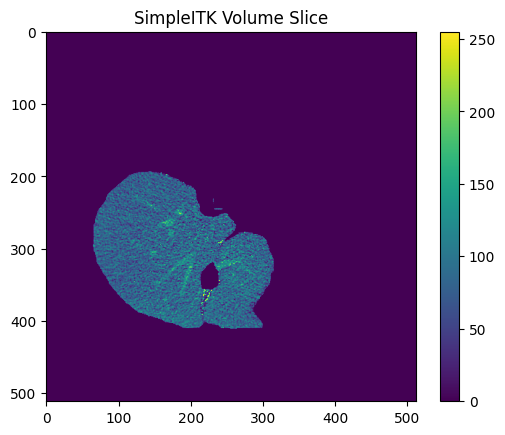

423
Number of Contours found = 11
Number of Contours draw = 0


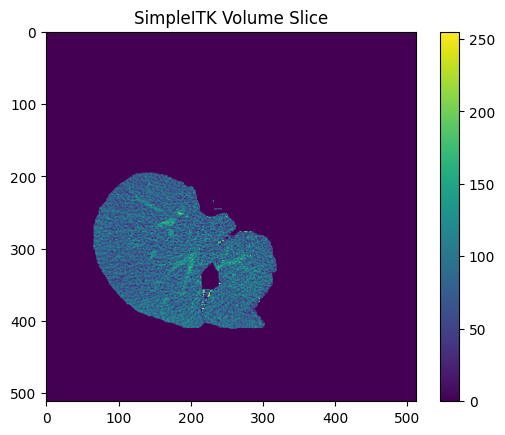

424
Number of Contours found = 7
Number of Contours draw = 0


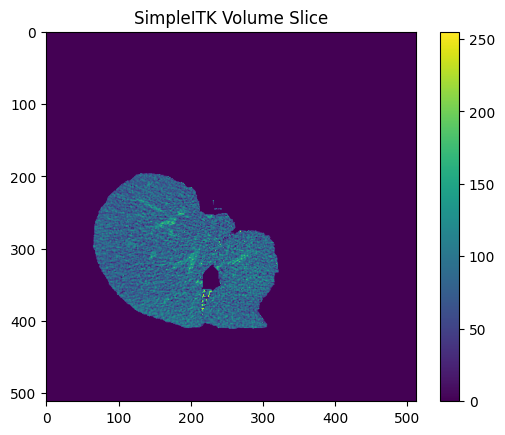

425
Number of Contours found = 11
Number of Contours draw = 0


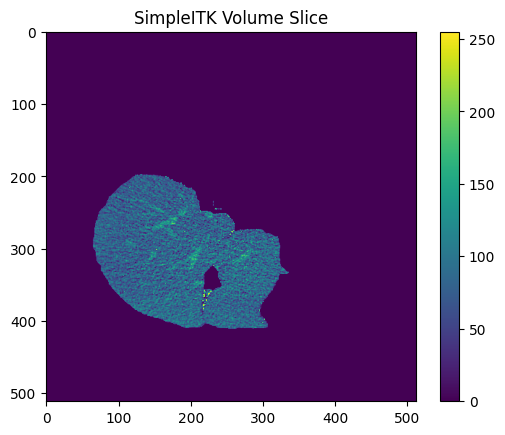

426
Number of Contours found = 10
Number of Contours draw = 0


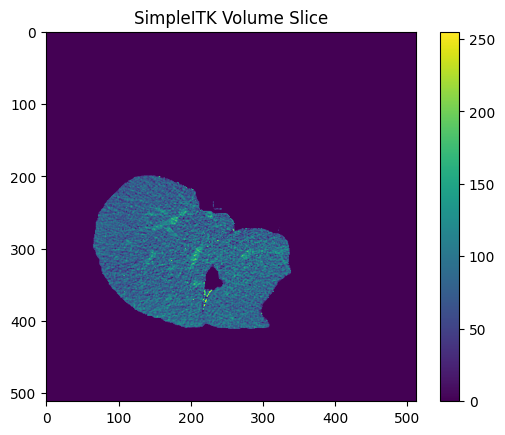

427
Number of Contours found = 9
Number of Contours draw = 1


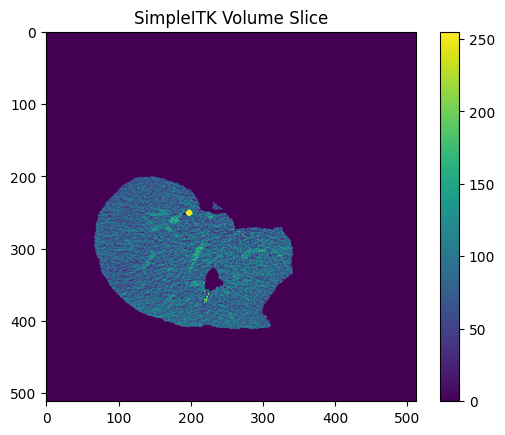

428
Number of Contours found = 14
Number of Contours draw = 2


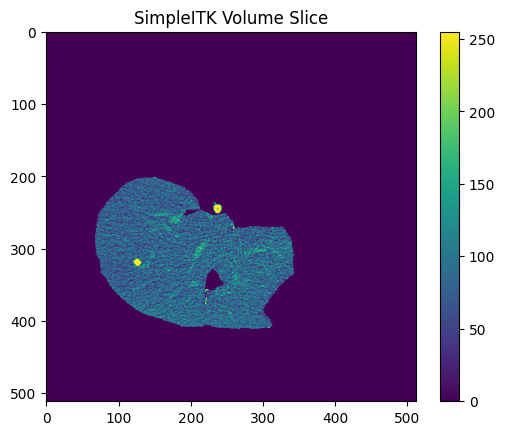

429
Number of Contours found = 8
Number of Contours draw = 0


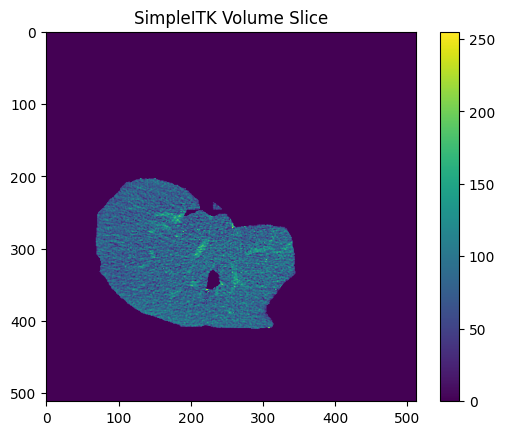

430
Number of Contours found = 11
Number of Contours draw = 0


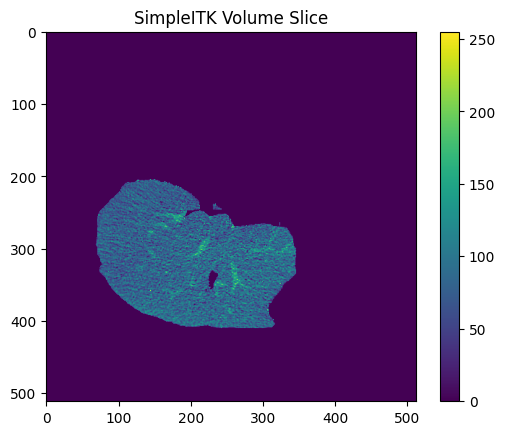

431
Number of Contours found = 14
Number of Contours draw = 0


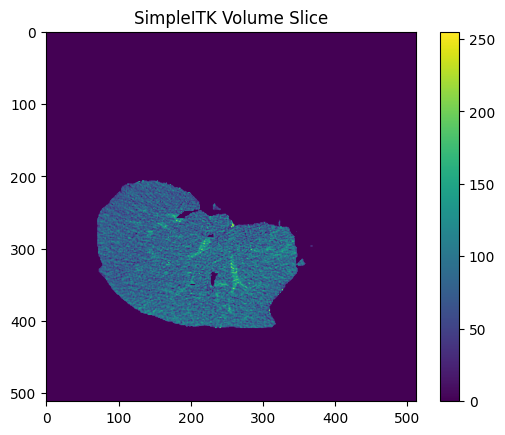

432
Number of Contours found = 20
Number of Contours draw = 4


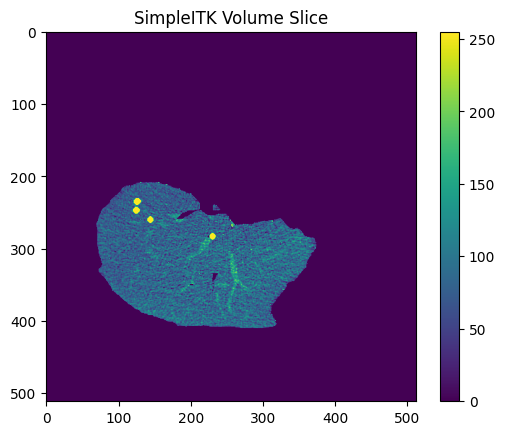

433
Number of Contours found = 14
Number of Contours draw = 2


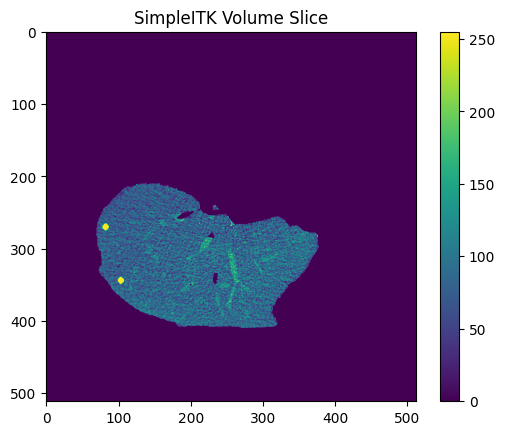

434
Number of Contours found = 16
Number of Contours draw = 0


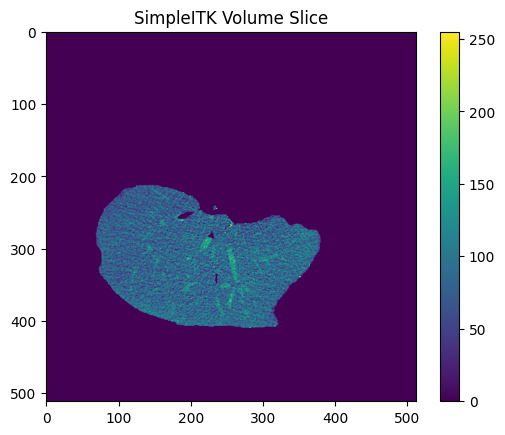

435
Number of Contours found = 11
Number of Contours draw = 0


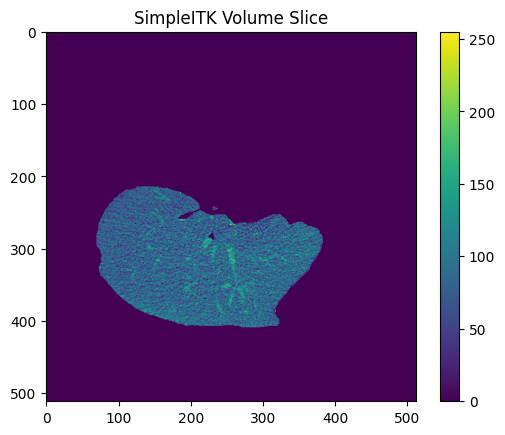

436
Number of Contours found = 18
Number of Contours draw = 0


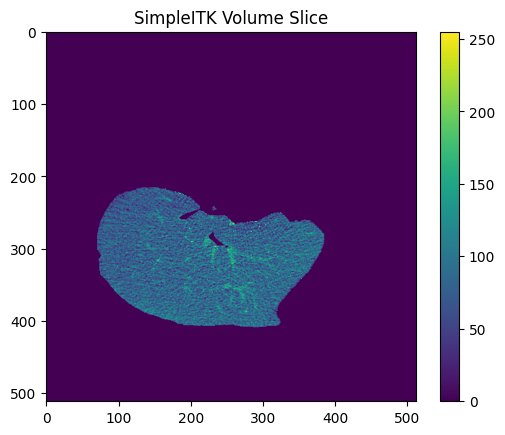

437
Number of Contours found = 15
Number of Contours draw = 0


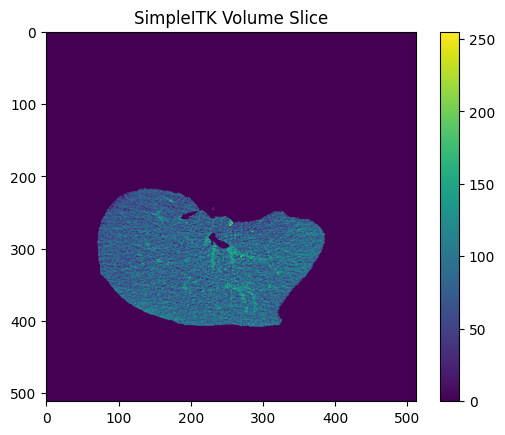

438
Number of Contours found = 14
Number of Contours draw = 12


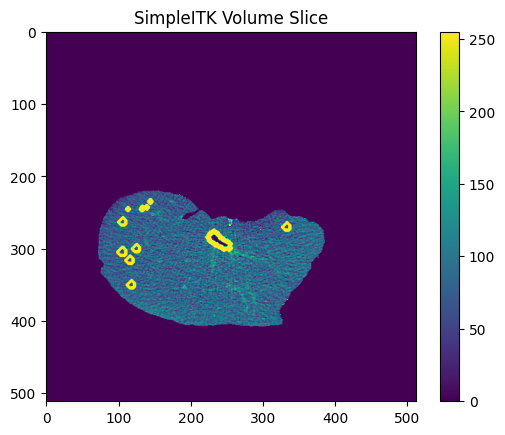

439
Number of Contours found = 10
Number of Contours draw = 0


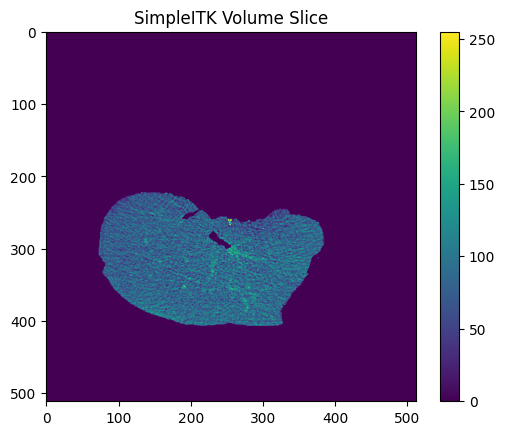

440
Number of Contours found = 10
Number of Contours draw = 8


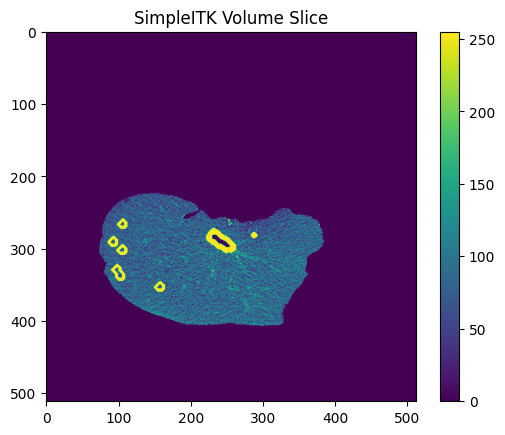

441
Number of Contours found = 10
Number of Contours draw = 8


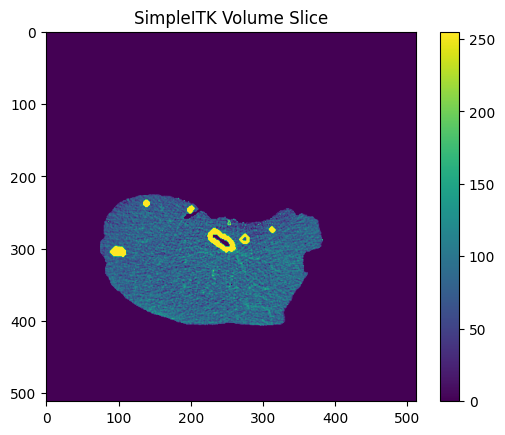

442
Number of Contours found = 7
Number of Contours draw = 5


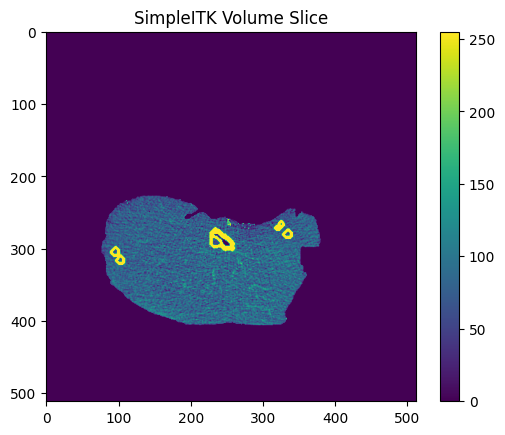

443
Number of Contours found = 7
Number of Contours draw = 0


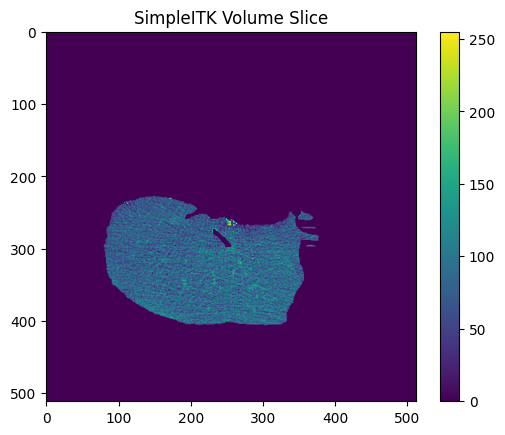

444
Number of Contours found = 5
Number of Contours draw = 0


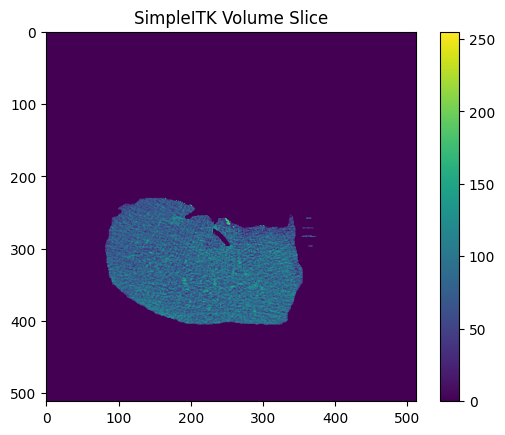

445
Number of Contours found = 6
Number of Contours draw = 0


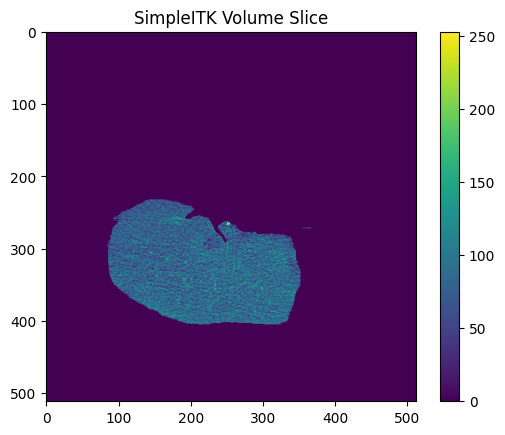

446
Number of Contours found = 8
Number of Contours draw = 6


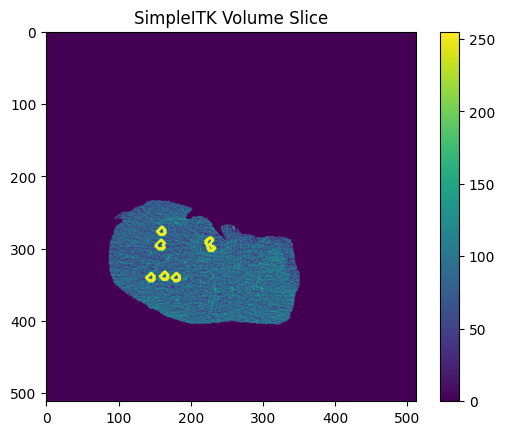

447
Number of Contours found = 10
Number of Contours draw = 8


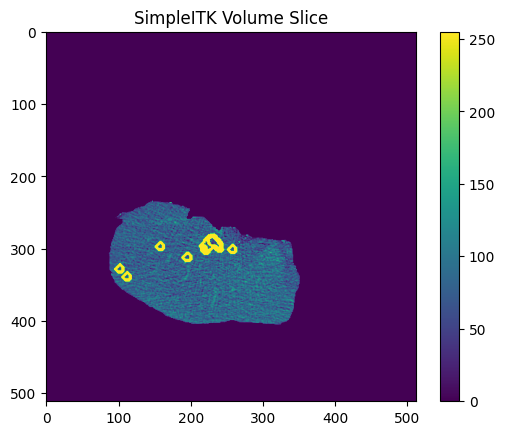

448
Number of Contours found = 10
Number of Contours draw = 8


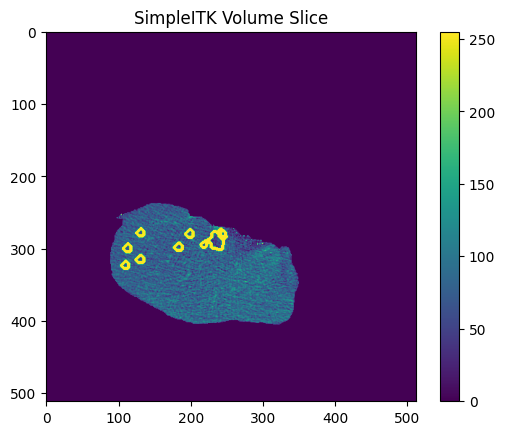

449
Number of Contours found = 9
Number of Contours draw = 7


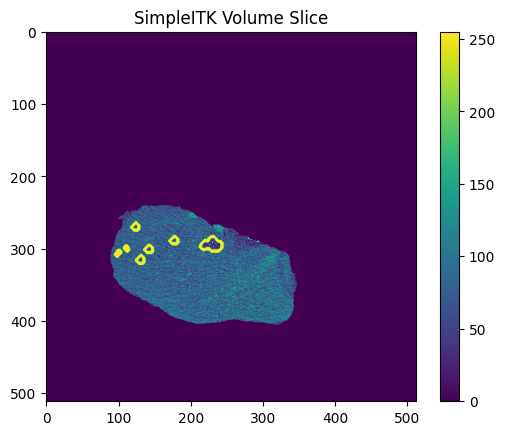

450
Number of Contours found = 9
Number of Contours draw = 7


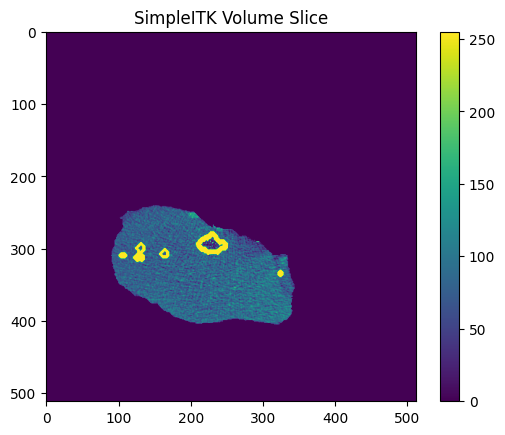

451
Number of Contours found = 6
Number of Contours draw = 4


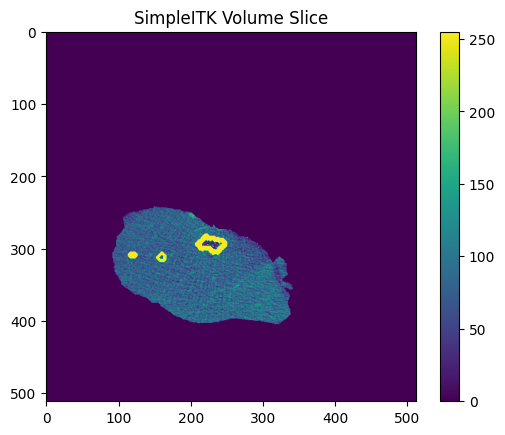

452
Number of Contours found = 11
Number of Contours draw = 9


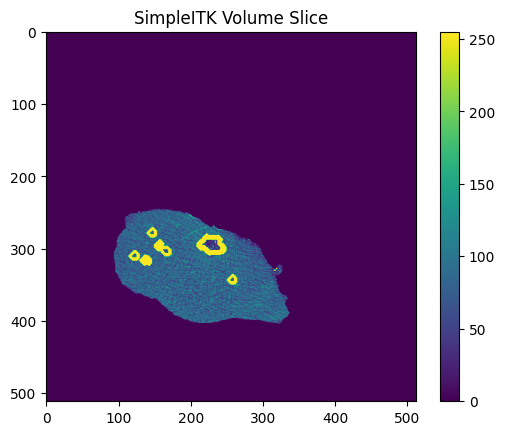

453
Number of Contours found = 8
Number of Contours draw = 6


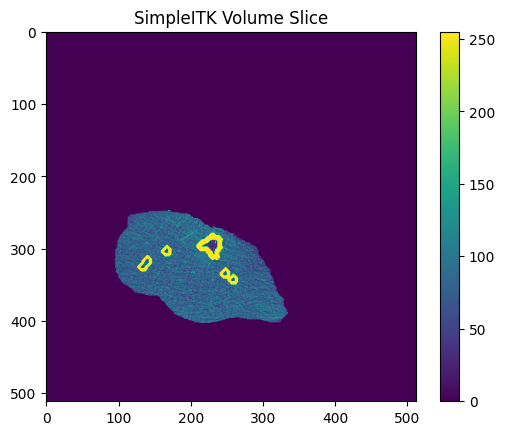

454
Number of Contours found = 5
Number of Contours draw = 3


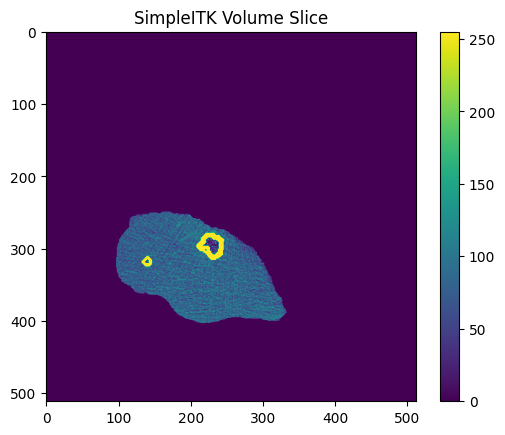

455
Number of Contours found = 4
Number of Contours draw = 2


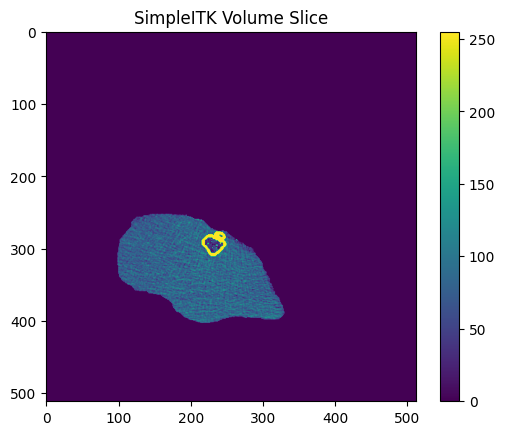

456
Number of Contours found = 3
Number of Contours draw = 1


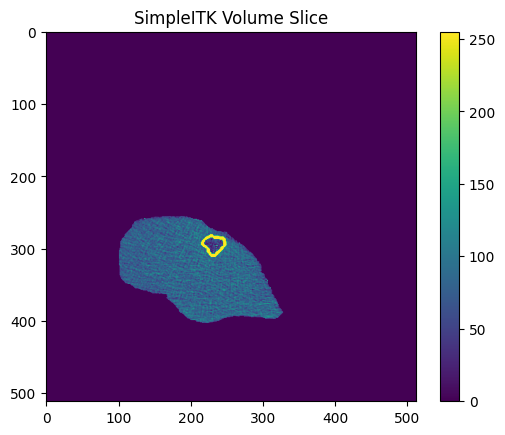

457
Number of Contours found = 5
Number of Contours draw = 3


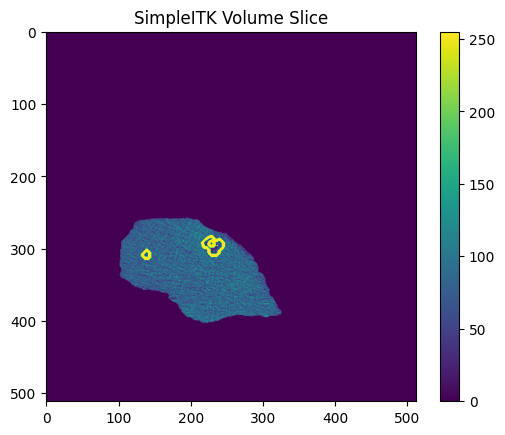

458
Number of Contours found = 2
Number of Contours draw = 0


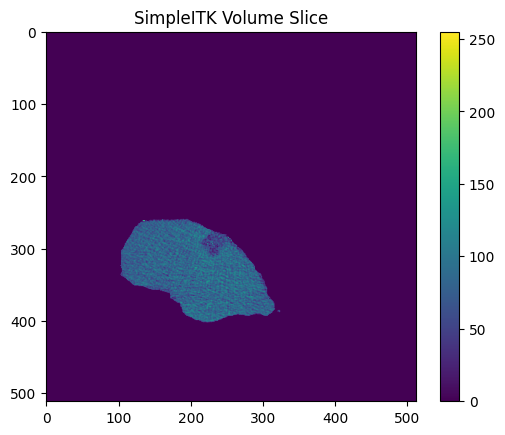

459
Number of Contours found = 2
Number of Contours draw = 0


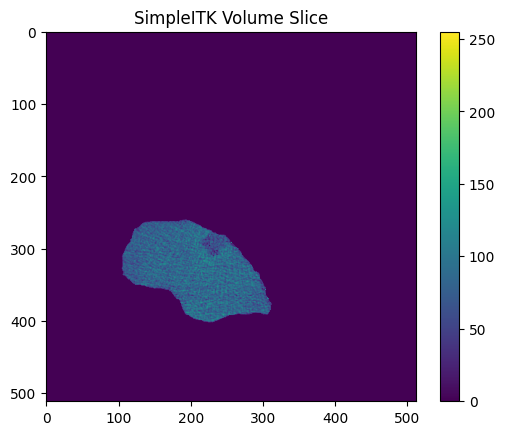

460
Number of Contours found = 3
Number of Contours draw = 1


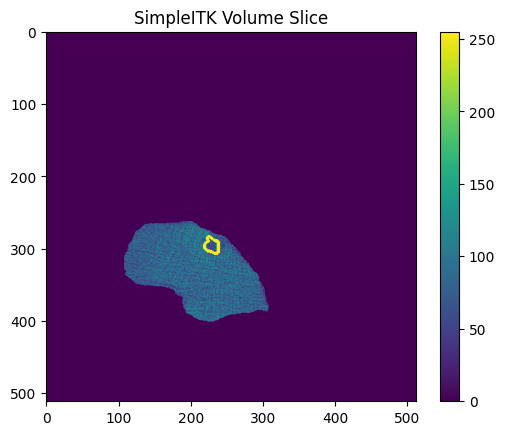

461
Number of Contours found = 5
Number of Contours draw = 3


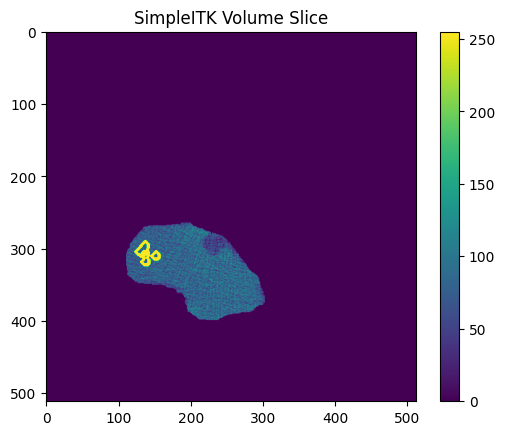

462
Number of Contours found = 2
Number of Contours draw = 0


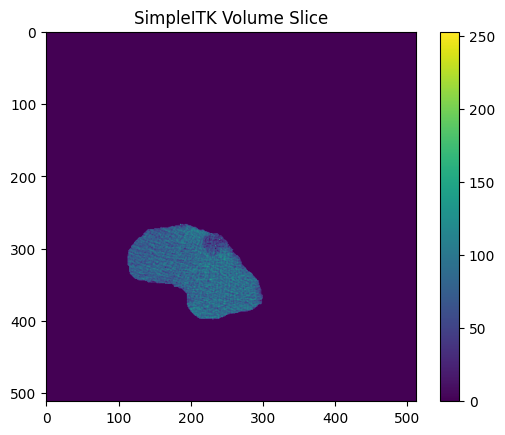

463
Number of Contours found = 2
Number of Contours draw = 0


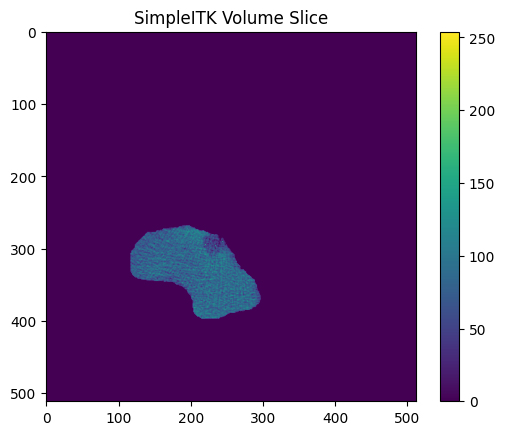

464
Number of Contours found = 2
Number of Contours draw = 0


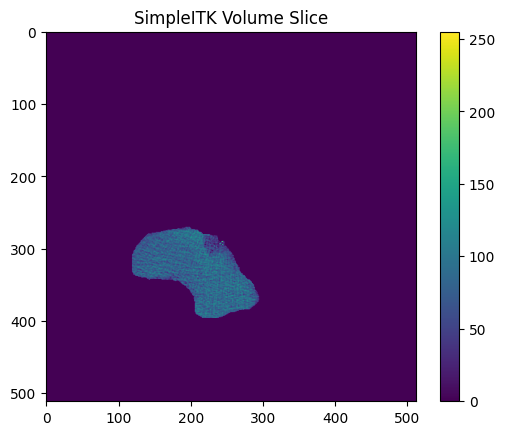

465
Number of Contours found = 2
Number of Contours draw = 0


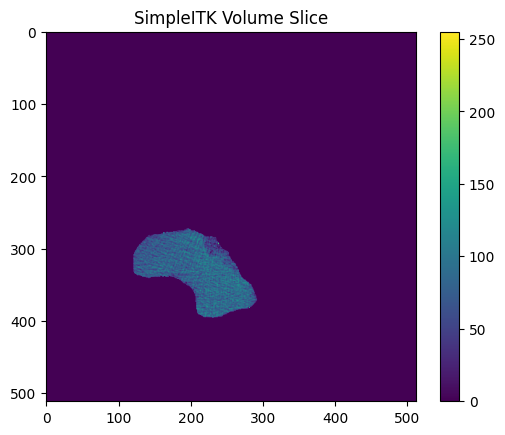

466
Number of Contours found = 3
Number of Contours draw = 1


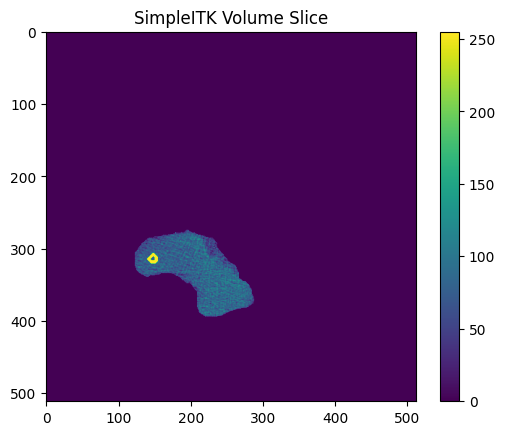

467
Number of Contours found = 2
Number of Contours draw = 0


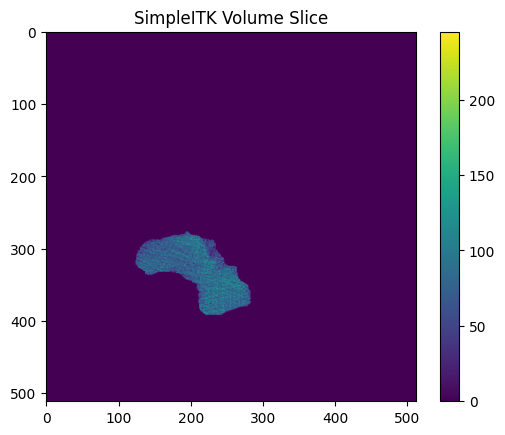

468
Number of Contours found = 2
Number of Contours draw = 0


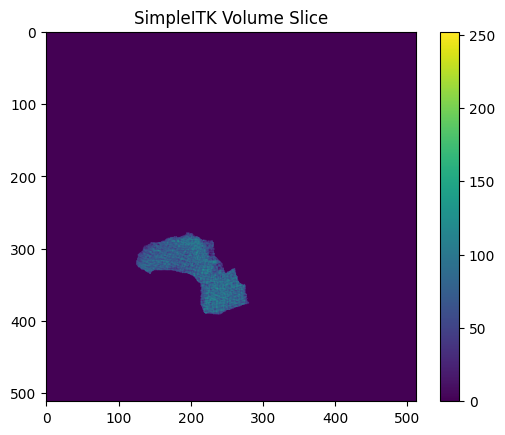

469
Number of Contours found = 2
Number of Contours draw = 0


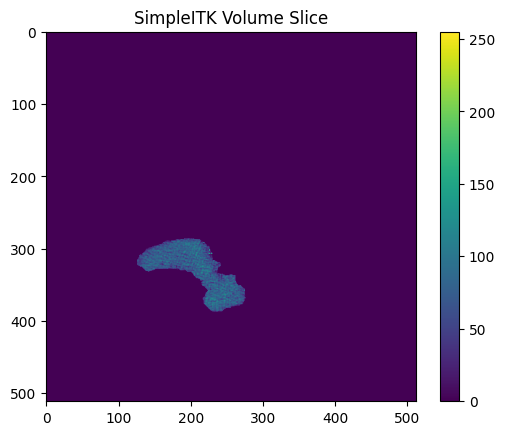

470
Number of Contours found = 3
Number of Contours draw = 2


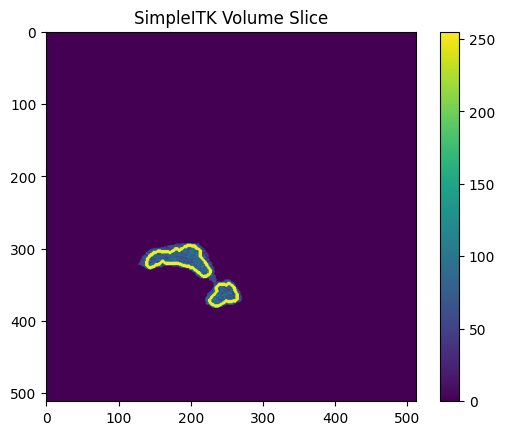

471
Number of Contours found = 6
Number of Contours draw = 3


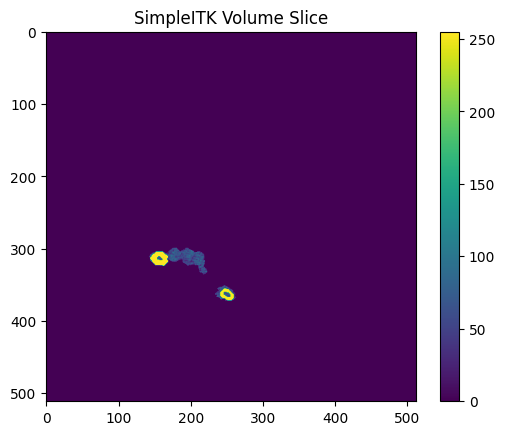

472
Number of Contours found = 1
Number of Contours draw = 0


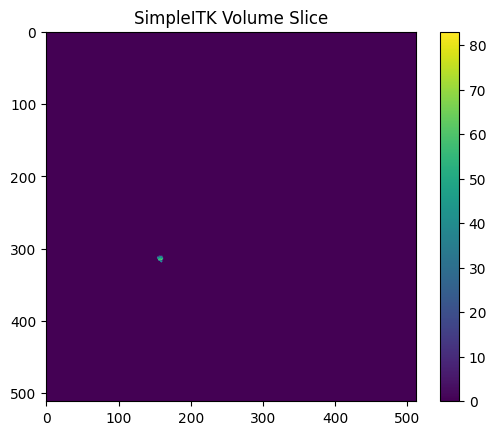

473
Number of Contours found = 0
474
Number of Contours found = 0
475
Number of Contours found = 0
476
Number of Contours found = 0
477
Number of Contours found = 0
478
Number of Contours found = 0
479
Number of Contours found = 0
480
Number of Contours found = 0
481
Number of Contours found = 0
482
Number of Contours found = 0
483
Number of Contours found = 0
484
Number of Contours found = 0
485
Number of Contours found = 0
486
Number of Contours found = 0
487
Number of Contours found = 0
488
Number of Contours found = 0
489
Number of Contours found = 0
490
Number of Contours found = 0
491
Number of Contours found = 0
492
Number of Contours found = 0
493
Number of Contours found = 0
494
Number of Contours found = 0
495
Number of Contours found = 0
496
Number of Contours found = 0
497
Number of Contours found = 0
498
Number of Contours found = 0
499
Number of Contours found = 0
500
Number of Contours found = 0
501
Number of Contours found = 0
502
Number of Contours found = 0
503
Number

In [29]:

import matplotlib.pyplot as plt
import cv2
import numpy as np
import SimpleITK as sitk

cnt_list=[]

reader = sitk.ImageFileReader()
reader.SetImageIO("NiftiImageIO")
reader.SetFileName(r'/content/data/segmentations/segmentation-2.nii')
segment = reader.Execute();
segment = sitk.BinaryThreshold(segment, lowerThreshold=1, upperThreshold=255, insideValue=1, outsideValue=0)
#segment =sitk.OtsuThreshold(segment)



reader = sitk.ImageFileReader()
reader.SetImageIO("NiftiImageIO")
reader.SetFileName(r'/content/data/volume_pt1/volume-2.nii')
image = reader.Execute();


image=sitk.Cast(image, sitk.sitkUInt8)
segment=sitk.Cast(segment, sitk.sitkUInt8)
masked_volume = sitk.Mask(image, segment)



image_array = sitk.GetArrayFromImage(masked_volume)
segment_array = sitk.GetArrayFromImage(segment)

#slice_number = round(len(image_array[:,0,0])/2)+150

for slice_number in range(0,len(image_array[:,0,0])):
  print(slice_number)
  # Get the 2D slice from the 3D volume
  slice_to_display = image_array[ slice_number, :,:]
  segment_slice=segment_array[ slice_number, :,:]


  hist_mask = cv2.calcHist([slice_to_display],[0],segment_slice,[256],[0,256])
  cdf = hist_mask.cumsum()
  cdf = cdf / cdf[-1]  # Normalize CDF to [0, 1]

  # Find the bin corresponding to the 40th percentile
  percentile_value = 0.4  # 40th percentile
  bin_index = int(np.searchsorted(cdf, percentile_value))


  b_mask=cv2.inRange(slice_to_display,0,bin_index)


  kernel = np.ones((4, 4), np.uint8)
  img_erosion = cv2.erode(b_mask, kernel, iterations=1)
  img_dilation = cv2.dilate(img_erosion, kernel, iterations=2)

  kernel = np.ones((5,5),np.float32)/25
  img_smoothed = cv2.filter2D(img_dilation,-1,kernel)


  kernel = np.ones((3,3),np.float32)/25
  edged = cv2.Canny(img_smoothed, 30, 200)
  edged2 = cv2.dilate(edged, kernel, iterations=2)
  img_erosion2 = cv2.erode(edged2, kernel, iterations=1)

  contours, hierarchy = cv2.findContours(img_erosion2,cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)


  print("Number of Contours found = " + str(len(contours)))

  cnt=[]
  rect=[]
  image_array = sitk.GetArrayFromImage(masked_volume)
  sliced = image_array[ slice_number, :,:]

  segment_array = sitk.GetArrayFromImage(segment)
  segment_slice=segment_array[ slice_number, :,:]
  edged_seg = segment_slice
  contours_seg, hierarchy2 = cv2.findContours(edged_seg,cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
  # plt.imshow(edged_seg)
  # plt.title(str(slice_number))
  # plt.colorbar()
  # plt.show()





  # Iterate through the sorted contours
  if len(contours)>0 and len(contours_seg)>0:
    area_s = cv2.contourArea(contours_seg[0])
    rect1 = cv2.boundingRect(contours_seg[0])
    area_inside_rect1_s = rect1[2] * rect1[3]

    for contour in contours:
        # Get the area of the current contour
        area = cv2.contourArea(contour)
        rect1 = cv2.boundingRect(contour)
        #cnt.append(contour)


        area_inside_rect1 = rect1[2] * rect1[3]
        if area>1 and area_inside_rect1<2*area_inside_rect1_s/3:

          cnt.append(contour)

        # Print the result
        #print("Area inside rect1:", area_inside_rect1)

        # Do something with the contour or area (e.g., print the area)
      # print(f"Contour area: {area}")

    print("Number of Contours draw = " + str(len(cnt)))
    cnt_list.append(cnt)







    cv2.drawContours(sliced, cnt, -1, (255, 255, 255),3)

    plt.imshow(sliced)
    plt.title("SimpleITK Volume Slice")
    plt.colorbar()
    plt.show()

In [30]:
t=[]
for i in cnt_list[62]:
  if(cv2.contourArea(i)>0):
    t.append(i)
    print(cv2.contourArea(i))

In [31]:
for u in t:
  filled_image = np.zeros_like(sliced)
  cv2.fillPoly(filled_image, u, color=(255, 0,0))
  plt.imshow(filled_image)
  plt.title("SimpleITK Volume Slice")
  plt.colorbar()
  plt.show()

In [32]:
!pip install --upgrade kornia > /dev/null
!pip install --upgrade fastai > /dev/null

In [33]:
import os
import glob
import cv2
import imageio

import numpy as np
import pandas as pd
import nibabel as nib
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm
from ipywidgets import *
from PIL import Image
from matplotlib.pyplot import figure

from fastai.basics import *
from fastai.vision.all import *
from fastai.data.transforms import *

In [34]:
# Create a meta file for nii files processing

file_list = []
for dirname, _, filenames in os.walk('/content/data/segmentations'):
    for filename in filenames:
        file_list.append((dirname, filename))

for dirname, _, filenames in os.walk('/content/data/volume_pt1'):
    for filename in filenames:
        file_list.append((dirname, filename))

df_files = pd.DataFrame(file_list, columns =['dirname', 'filename'])
df_files.sort_values(by=['filename'], ascending=True)

,dirname,filename
32,/content/data/segmentations,segmentation-0.nii
128,/content/data/segmentations,segmentation-1.nii
18,/content/data/segmentations,segmentation-10.nii
107,/content/data/segmentations,segmentation-100.nii
98,/content/data/segmentations,segmentation-101.nii
...,...,...
137,/content/data/volume_pt1,volume-5.nii
134,/content/data/volume_pt1,volume-6.nii
139,/content/data/volume_pt1,volume-7.nii
132,/content/data/volume_pt1,volume-8.nii


In [35]:
# Map CT scan and label

df_files["mask_dirname"]  = ""
df_files["mask_filename"] = ""

for i in range(131):
    ct = f"volume-{i}.nii"
    mask = f"segmentation-{i}.nii"

    df_files.loc[df_files['filename'] == ct, 'mask_filename'] = mask
    df_files.loc[df_files['filename'] == ct, 'mask_dirname'] = "/content/data/segmentations"

# drop segment rows
df_files = df_files[df_files.mask_filename != ''].sort_values(by=['filename']).reset_index(drop=True)

df_files

,dirname,filename,mask_dirname,mask_filename
0,/content/data/volume_pt1,volume-0.nii,/content/data/segmentations,segmentation-0.nii
1,/content/data/volume_pt1,volume-1.nii,/content/data/segmentations,segmentation-1.nii
2,/content/data/volume_pt1,volume-10.nii,/content/data/segmentations,segmentation-10.nii
3,/content/data/volume_pt1,volume-2.nii,/content/data/segmentations,segmentation-2.nii
4,/content/data/volume_pt1,volume-3.nii,/content/data/segmentations,segmentation-3.nii
5,/content/data/volume_pt1,volume-4.nii,/content/data/segmentations,segmentation-4.nii
6,/content/data/volume_pt1,volume-5.nii,/content/data/segmentations,segmentation-5.nii
7,/content/data/volume_pt1,volume-6.nii,/content/data/segmentations,segmentation-6.nii
8,/content/data/volume_pt1,volume-7.nii,/content/data/segmentations,segmentation-7.nii
9,/content/data/volume_pt1,volume-8.nii,/content/data/segmentations,segmentation-8.nii


In [36]:
def read_nii(filepath):
    '''
    Reads .nii file and returns pixel array
    '''
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    return(array)

In [37]:
# Read sample

sample = 0
sample_ct = read_nii(df_files.loc[sample,'dirname']+"/"+df_files.loc[sample,'filename'])
sample_mask = read_nii(df_files.loc[sample,'mask_dirname']+"/"+df_files.loc[sample,'mask_filename'])

print(f'CT Shape:   {sample_ct.shape}\nMask Shape: {sample_mask.shape}')

CT Shape:   (512, 512, 75)
Mask Shape: (512, 512, 75)


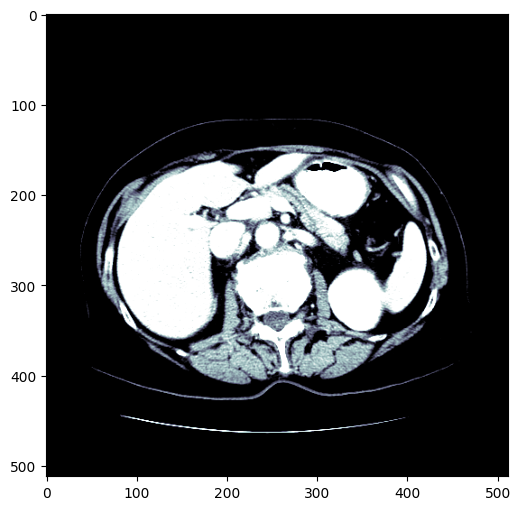

In [38]:
dicom_windows = types.SimpleNamespace(
    brain=(80,40),
    subdural=(254,100),
    stroke=(8,32),
    brain_bone=(2800,600),
    brain_soft=(375,40),
    lungs=(1500,-600),
    mediastinum=(350,50),
    abdomen_soft=(400,50),
    liver=(150,30),
    spine_soft=(250,50),
    spine_bone=(1800,400),
    custom = (200,60)
)

@patch
def windowed(self:Tensor, w, l):
    px = self.clone()
    px_min = l - w//2
    px_max = l + w//2
    px[px<px_min] = px_min
    px[px>px_max] = px_max
    return (px-px_min) / (px_max-px_min)

figure(figsize=(8, 6), dpi=100)

plt.imshow(tensor(sample_ct[..., 55].astype(np.float32)).windowed(*dicom_windows.liver), cmap=plt.cm.bone);


In [39]:
def plot_sample(array_list, color_map = 'nipy_spectral'):
    '''
    Plots and a slice with all available annotations
    '''
    fig = plt.figure(figsize=(20,16), dpi=100)

    plt.subplot(1,4,1)
    plt.imshow(array_list[0], cmap='bone')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1,4,2)
    plt.imshow(tensor(array_list[0].astype(np.float32)).windowed(*dicom_windows.liver), cmap='bone');
    plt.title('Windowed Image')
    plt.axis('off')

    plt.subplot(1,4,3)
    plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    plt.title('Mask')
    plt.axis('off')

    plt.subplot(1,4,4)
    plt.imshow(array_list[0], cmap='bone')
    plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    plt.title('Liver & Mask')
    plt.axis('off')

    plt.show()

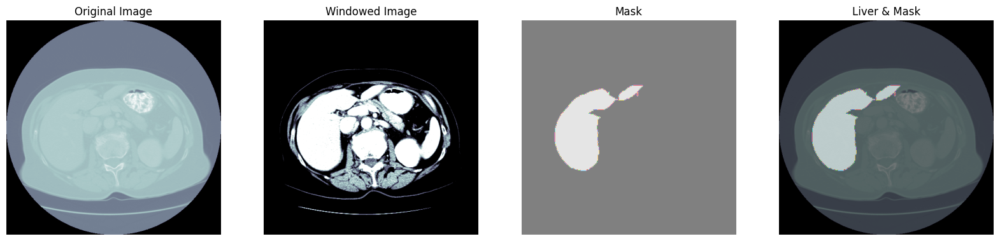

In [40]:
sample = 55

sample_slice = tensor(sample_ct[...,sample].astype(np.float32))

plot_sample([sample_ct[..., sample],
             sample_mask[..., sample]])

In [41]:
# Check the mask values
mask = Image.fromarray(sample_mask[...,sample].astype('uint8'), mode="L")
unique, counts = np.unique(mask, return_counts=True)
print(np.array((unique, counts)).T)

[[     0 244111]
 [     1  18033]]


<Axes: >

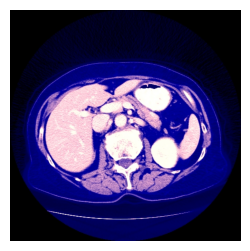

In [42]:
# Preprocessing functions
# Source https://docs.fast.ai/medical.imaging

class TensorCTScan(TensorImageBW): _show_args = {'cmap':'bone'}

@patch
def freqhist_bins(self:Tensor, n_bins=100):
    "A function to split the range of pixel values into groups, such that each group has around the same number of pixels"
    imsd = self.view(-1).sort()[0]
    t = torch.cat([tensor([0.001]),
                   torch.arange(n_bins).float()/n_bins+(1/2/n_bins),
                   tensor([0.999])])
    t = (len(imsd)*t).long()
    return imsd[t].unique()

@patch
def hist_scaled(self:Tensor, brks=None):
    "Scales a tensor using `freqhist_bins` to values between 0 and 1"
    if self.device.type=='cuda': return self.hist_scaled_pt(brks)
    if brks is None: brks = self.freqhist_bins()
    ys = np.linspace(0., 1., len(brks))
    x = self.numpy().flatten()
    x = np.interp(x, brks.numpy(), ys)
    return tensor(x).reshape(self.shape).clamp(0.,1.)


@patch
def to_nchan(x:Tensor, wins, bins=None):
    res = [x.windowed(*win) for win in wins]
    if not isinstance(bins,int) or bins!=0: res.append(x.hist_scaled(bins).clamp(0,1))
    dim = [0,1][x.dim()==3]
    return TensorCTScan(torch.stack(res, dim=dim))

@patch
def save_jpg(x:(Tensor), path, wins, bins=None, quality=120):
    fn = Path(path).with_suffix('.jpg')
    x = (x.to_nchan(wins, bins)*255).byte()
    im = Image.fromarray(x.permute(1,2,0).numpy(), mode=['RGB','CMYK'][x.shape[0]==4])
    im.save(fn, quality=quality)

_,axs = subplots(1,1)

sample_slice.save_jpg('test.jpg', [dicom_windows.liver, dicom_windows.custom])
show_image(Image.open('test.jpg'), ax=axs[0], figsize=(8, 6))

In [43]:
# Make custom JPG files for Unet training
# Total number of 131 nii files contains 67072 slices

GENERATE_JPG_FILES = True

if (GENERATE_JPG_FILES) :

    path = Path(".")

    os.makedirs('train_images',exist_ok=True)
    os.makedirs('train_masks',exist_ok=True)

    for ii in tqdm(range(0,len(df_files),3)): # take 1/3 nii files for training
        curr_ct        = read_nii(df_files.loc[ii,'dirname']+"/"+df_files.loc[ii,'filename'])
        curr_mask      = read_nii(df_files.loc[ii,'mask_dirname']+"/"+df_files.loc[ii,'mask_filename'])
        curr_file_name = str(df_files.loc[ii,'filename']).split('.')[0]
        curr_dim       = curr_ct.shape[2] # 512, 512, curr_dim

        for curr_slice in range(0,curr_dim,2): # export every 2nd slice for training
            data = tensor(curr_ct[...,curr_slice].astype(np.float32))
            mask = Image.fromarray(curr_mask[...,curr_slice].astype('uint8'), mode="L")
            data.save_jpg(f"train_images/{curr_file_name}_slice_{curr_slice}.jpg", [dicom_windows.liver,dicom_windows.custom])
            mask.save(f"train_masks/{curr_file_name}_slice_{curr_slice}_mask.png")
else:
    path = Path("../input/liver-segmentation-with-fastai-v2") # read jpg from saved kernel output

  0%|          | 0/4 [00:00<?, ?it/s]

In [44]:
BATCH_SIZE = 16
IMAGE_SIZE = 128

codes = np.array(["background","liver","tumor"])

def get_x(fname:Path): return fname
def label_func(x): return path/'train_masks'/f'{x.stem}_mask.png'

tfms = [IntToFloatTensor(),Normalize()]

db = DataBlock(blocks=(ImageBlock(),MaskBlock(codes)),  #codes = {"Backround": 0,"Liver": 1,"Tumor": 2}
               batch_tfms=tfms,
               splitter=RandomSplitter(),
               item_tfms=[Resize(IMAGE_SIZE)],
               get_items=get_image_files,
               get_y=label_func)

ds = db.datasets(source=path/'train_images')

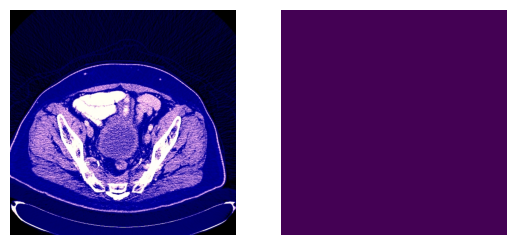

In [45]:
idx = 20
imgs = [ds[idx][0],ds[idx][1]]
fig, axs = plt.subplots(1, 2)

for i,ax in enumerate(axs.flatten()):
    ax.axis('off')
    ax.imshow(imgs[i])

In [46]:
unique, counts = np.unique(array(ds[idx][1]), return_counts=True)

print( np.array((unique, counts)).T)

[[     0 262144]]


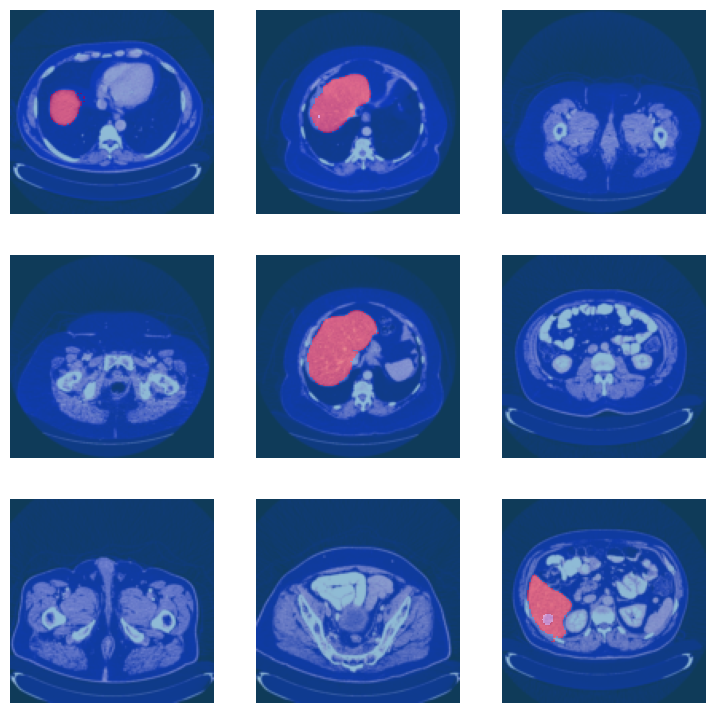

In [47]:
dls = db.dataloaders(path/'train_images', bs = BATCH_SIZE) #, num_workers=0
dls.show_batch()

In [48]:
def foreground_acc(inp, targ, bkg_idx=0, axis=1):  # exclude a background from metric
    "Computes non-background accuracy for multiclass segmentation"
    targ = targ.squeeze(1)
    mask = targ != bkg_idx
    return (inp.argmax(dim=axis)[mask]==targ[mask]).float().mean()

def cust_foreground_acc(inp, targ):  # # include a background into the metric
    return foreground_acc(inp=inp, targ=targ, bkg_idx=3, axis=1) # 3 is a dummy value to include the background which is 0

In [49]:
learn = unet_learner(dls,
                     resnet50,
                     loss_func=CrossEntropyLossFlat(axis=1),
                     metrics=[foreground_acc, cust_foreground_acc])

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 73.5MB/s]


In [50]:
learn.fine_tune(5, wd=0.1, cbs=SaveModelCallback() )

epoch,train_loss,valid_loss,foreground_acc,cust_foreground_acc,time
0,0.264010,0.112954,0.000000,0.976639,00:55


Better model found at epoch 0 with valid_loss value: 0.11295439302921295.


epoch,train_loss,valid_loss,foreground_acc,cust_foreground_acc,time
0,0.022612,0.069384,0.914706,0.995279,00:49
1,0.012661,0.144234,0.848365,0.995348,00:50
2,0.008143,0.008963,0.924783,0.997469,00:49
3,0.005400,0.010496,0.947284,0.997816,00:50
4,0.004109,0.006694,0.950518,0.997988,00:49


Better model found at epoch 0 with valid_loss value: 0.06938397884368896.
Better model found at epoch 2 with valid_loss value: 0.00896326545625925.
Better model found at epoch 4 with valid_loss value: 0.00669364957138896.


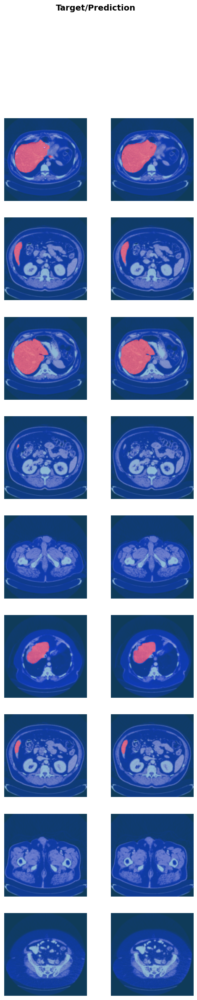

In [51]:
learn.show_results()

In [69]:
learn.export('/content/drive/MyDrive/ipmv/Liver_segmentation.pk1')

In [67]:
import os
from google.colab import drive

# Mount Google Drive
#drive.mount('/content/drive')

# Define the directory path
directory_path = '/content/drive/MyDrive/ipmv/Liver_segmentation'

# Create the directory if it doesn't exist
if not os.path.exists(directory_path):
    os.makedirs(directory_path)

# Export your learn object to the directory
learn.export(os.path.join(directory_path,'Liver_segmentation.pk1'))


In [82]:
# Load saved model
if (GENERATE_JPG_FILES) :

    tfms = [Resize(IMAGE_SIZE), IntToFloatTensor(),Normalize()]
    learn0 = load_learner(path/f'/content/drive/MyDrive/ipmv/Liver_segmentation/Liver_segmentation.pk1',cpu=False )
    learn0.dls.transform = tfms

In [76]:
def nii_tfm(fn,wins):

    test_nii  = read_nii(fn)
    curr_dim  = test_nii.shape[2] # 512, 512, curr_dim
    slices = []

    for curr_slice in range(curr_dim):
        data = tensor(test_nii[...,curr_slice].astype(np.float32))
        data = (data.to_nchan(wins)*255).byte()
        slices.append(TensorImage(data))

    return slices

(512, 512, 549)


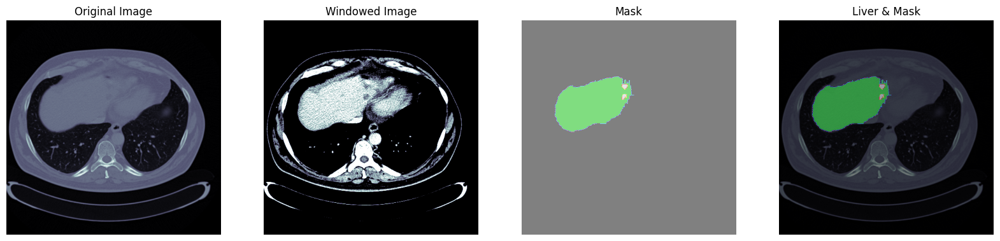

In [77]:
tst = 10

test_nii   = read_nii(df_files.loc[tst,'dirname']+"/"+df_files.loc[tst,'filename'])
test_mask  = read_nii(df_files.loc[tst,'mask_dirname']+"/"+df_files.loc[tst,'mask_filename'])
print(test_nii.shape)

test_slice_idx = 500

sample_slice = tensor(test_nii[...,test_slice_idx].astype(np.float32))

plot_sample([test_nii[...,test_slice_idx], test_mask[...,test_slice_idx]])

In [78]:
# Prepare a nii test file for prediction

test_files = nii_tfm(df_files.loc[tst,'dirname']+"/"+df_files.loc[tst,'filename'],[dicom_windows.liver, dicom_windows.custom])
print("Number of test slices: ", len(test_files))

Number of test slices:  549


<Axes: >

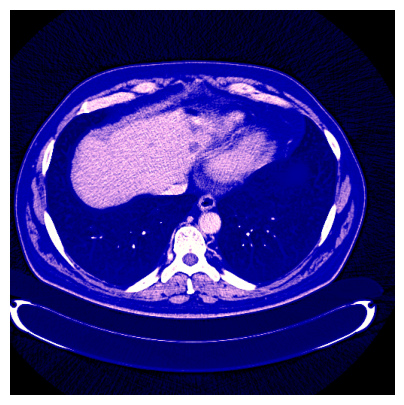

In [79]:
# Check an input for a test file
show_image(test_files[test_slice_idx])

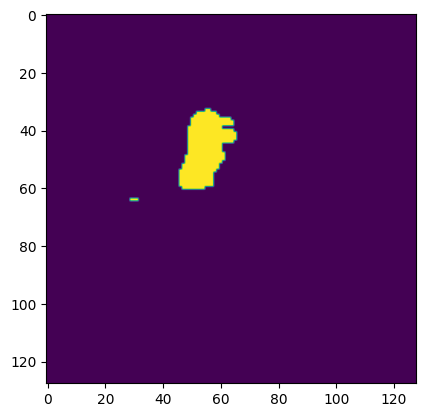

In [83]:
# Get predictions for a Test file

test_dl = learn0.dls.test_dl(test_files)
preds, y = learn0.get_preds(dl=test_dl)

predicted_mask = np.argmax(preds, axis=1)

plt.imshow(predicted_mask[test_slice_idx])

In [54]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
